<a class="anchor" id = "contents"></a>

# 목차


    
1. [개요 및 라이브러리 로드](#1)<br>
  
  
2. [데이터 로드 및 변수요약](#2)<br>
  
  
3. [EDA(탐색적 데이터분석)](#3)<br>
    3-1. [데이터 클리닝(데이터 확인 및 파생변수 생성 아이디어 도출)](#3-1)<br>
    3-2. [시각화 분석](#3-2)<br>
    3-3. [다음 분석 절차 요약](#3-3)<br>
  
  
4. [데이터 전처리](#4) <br>  
  
  
5. [주성분 분석(PCA)을 이용한 변수 추출](#5) <br>
    
    
6. [K-Means clustering을 이용한 고객 세분화](#6)<br>
  
  
7. [고객 프로파일링](#7)<br>
    7-1. [클러스터 요약](#7-1)<br>
    7-2. [클러스터 별 구매행동](#7-2)<br>
    7-3. [클러스터 별 개인정보](#7-3)<br>
    7-4. [클러스터 별 고객 프로파일링 및 마케팅 제안](#7-4)<br>
  
  
8. [결론 및 한계점](#8)<br>
    
<br>

<a class="anchor" id = "1"></a>

# 1. 개요 및 라이브러리 로드

<br>

**Customer Personality Analysis**

**데이터 설명**
* 출처: [[링크]]https://thecleverprogrammer.com/2021/02/08/customer-personality-analysis-with-python/
* 2,240건의 고객 구매 데이터
* 출처는 불분명([링크](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis/discussion/268078?sort=votes))하나, 가입일 변수를 통해 2012년 1월 8일부터 2014년 12월 6일까지 가입한 회원들의 온/오프라인 마트 구매내역으로 추정할 수 있음

<br>

**프로젝트 목표**
* 고객 데이터를 분석하고,
* PCA(주성분 분석)와 K-Means clustering 방법론을 이용하여,
* 고객을 세분화한 뒤 각 세그먼트의 고객 프로파일링 수행


<br>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
plt.style.use(['fivethirtyeight'])
sns.set(font_scale = 1)
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')
np.random.seed(42)

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn import metrics
from sklearn.metrics import silhouette_score

from yellowbrick.cluster import KElbowVisualizer
from mpl_toolkits.mplot3d import Axes3D
# from matplotlib import colors
# from matplotlib.colors import ListedColormap

print("Let's start!")

Let's start!


***[목차로 이동](#contents)***

<a class="anchor" id = "2"></a>

# 2. 데이터 로드 및 변수 요약

In [2]:
data = pd.read_csv("marketing_campaign.csv", sep = '\t')
display(data.shape, data.head(3))

(2240, 29)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0


In [3]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

<br>

### 변수 요약

* **고객 기본정보 관련 변수(10)**
    + ID
    + Year_Birth
    + Education: 교육 수준
    + Marital_Status: 혼인 상태
    + Income: 연간 소득
    + Kidhome: 아동 자녀 수
    + Teenhome: 10대 자녀 수
    + Dt_Customer: 최초 고객등록일
    + Recency: 현재일 - 최근 구매일
    + Complain: 최근 2년간 클레임이 있었다면 1, 아니면 0
    
    
* **제품 관련 변수(6): 최근 2년간 구매금액**
    + MntWines: 와인
    + MntFruits: 과일
    + MntMeatProducts: 육류
    + MntFishProducts: 생선류
    + MntSweetProducts: 과자류
    + MntGoldProds: gold(?)


* **프로모션 관련 변수(7)**
    * ***note: 분석 결과, 할인과 프로모션은 구분하여 해석할 필요가 있습니다.***
    + NumDealsPurchases: 할인받아 구매한 수
    + AcceptedCmp1: 1번째 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    + AcceptedCmp2: 2번째 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    + AcceptedCmp3: 3번째 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    + AcceptedCmp4: 4번째 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    + AcceptedCmp5: 5번째 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    + Response: 마지막 캠페인에서 구매를 이끌어냈다면 1, 아니면 0
    
    
* **구매 장소 관련 변수(4)**
    + NumWebPurchases: 회사 웹사이트에서 구매한 횟수
    + NumCatalogPurchases: 카탈로그를 통하여 구매한 횟수
    + NumStorePurchases: 매장에서 직접 구매한 횟수
    + NumWebVisitMonth: 지난 달 웹사이트 방문 횟수

<br>

***[목차로 이동](#contents)***

<br>
<a class="anchor" id = "3"></a>

# 3. EDA(탐색적 데이터 분석) 

데이터와 관련한 정보를 살펴보고, 데이터 클리닝 및 파생 변수 생성 등을 수행하였습니다.

<br>

<a class="anchor" id = "3-1"></a>

## 3-1. 데이터 클리닝 

### 변수별 결측치, 단일값 등 요약 확인


In [4]:
data_info = pd.DataFrame(columns=['Name of Col', 'Num of Null', 'Dtype', 'N_Unique'])

for i in range(0, len(data.columns)):
    data_info.loc[i] = [data.columns[i],
                        data[data.columns[i]].isnull().sum(),
                        data[data.columns[i]].dtypes,
                        data[data.columns[i]].nunique()] 
    
data_info

,Name of Col,Num of Null,Dtype,N_Unique
0,ID,0,int64,2240
1,Year_Birth,0,int64,59
2,Education,0,object,5
3,Marital_Status,0,object,8
4,Income,24,float64,1974
5,Kidhome,0,int64,3
6,Teenhome,0,int64,3
7,Dt_Customer,0,object,663
8,Recency,0,int64,100
9,MntWines,0,int64,776


<br>

* `Income` 변수에 24개의 결측치가 존재: 비중이 1% 정도이므로 해당 행 삭제

* `DT_customer` 변수 조작 시 날짜형으로 변환 필요

* `Education`, `Marital_Status` 등 명목형 변수들의 인코딩 필요

In [5]:
# 결측치 존재 행 삭제
data.dropna(inplace = True)

data.shape

(2216, 29)

### 가입일 확인

In [6]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%d-%m-%Y')
dates = []

for i in data['Dt_Customer']:
    i = i.date()
    dates.append(i)

print("The newest customer's enrolment date in the records:", max(dates))
print("The oldest customer's enrolment date in the records:", min(dates))


The newest customer's enrolment date in the records: 2014-06-29
The oldest customer's enrolment date in the records: 2012-07-30


- 고객 중 가장 최근 가입일을 기준일로 하여, 고객의 체류기간을 나타내는 Cus_for라는 파생변수 생성

In [7]:
days = []
d1 = max(dates)

for i in dates:
    delta = d1 - i
    days.append(delta)
    
days[0]

datetime.timedelta(days=663)

In [8]:
# timedelta 타입의 데이터를 정수변환하기 위해 .days 메서드 이용하여 정수 데이터만 추출

days_int = []
for i in range(0, len(days)):
    days_int.append(days[i].days)  
    
days_int[0]

663

In [9]:
data['Cus_for'] = days_int

In [10]:
print(data["Cus_for"].dtypes) 
data['Cus_for'].head(1) 

int64


0    663
Name: Cus_for, dtype: int64

<br>

### 범주형 변수의 count 확인


변수들 중, `Marital_Status`과 `Education`의 단일값 및 카운트를 확인하였습니다.

* `Marital_Status` 변수는 총 8개의 카테고리가 있습니다.
* `Education` 변수는 총 5개의 카테고리가 있습니다.

In [11]:
print(data.Marital_Status.value_counts())
print(f'Num of unique category: {data.Marital_Status.nunique()}')
print('\n')
print(data.Education.value_counts())
print(f'Num of unique category: {data.Education.nunique()}')

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64
Num of unique category: 8


Education
Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: count, dtype: int64
Num of unique category: 5


<br>

### 파생변수 생성 아이디어 도출

기존 주어진 변수들을 이용하여, 아래와 같이 분석에 도움이 될 것으로 판단되는 파생변수들을 추가 생성하였습니다.


+ `Year_Birth`: 이를 이용하여 나이를 나타내는 변수를 만들 수 있습니다.


+ `Education`: 아래와 같이, 8개의 범주를 3개의 범주로 간단하게 변경할 수 있습니다.
    * {Basic: Basic Education, Graduation: Graduated from Univ., Post graduate : (2n Cycle + Master + PhD)}
    
    
+ `Marital_Status`: 변수 이름을 `Living_with`로 변경하고, 아래와 같이 5개의 범주를 2개의 범주로 맵핑합니다.
    * {(Married + Together) : Partner, otherwise : Alone}
    
    
+ `Children` = `Kidhome` + `Teenhome` 을 합산하여 총 자녀수 컬럼을 생성합니다.


+ `Spent_All`: 구매금액 관련된 컬럼의 값을 모두 더하여 총 구매금액을 나타냅니다.


+ `PurchaseNumAll`: 구매횟수와 관련된 컬럼의 값을 모두 더하여 총 구매횟수를 나타냅니다.


+ `PurDeal_PurAll_ratio`: `할인에 의한 구매횟수` / `총 구매횟수` 로 할인 구매의 비율을 나타냅니다.


+ `Total_Promos`: 프로모션에서 accept한 수를 나타냅니다. 본 데이터로는 총 6회의 프로모션이 있었고, 6번 모두 accept했다면 `Total_Promos`에는 6이 될 것입니다.


+ `Family_Size`: 위에서 생성한 `Living_with` 변수에 대해 아래와 같이 맵핑하여 총 가족 수를 구합니다.
    * ({"Alone": 1, "Partner":2})+ data["Children"]


+ `Is_Parent`: (data["Children"] > 0, 1, 0), 즉, 자녀수가 0보다 크면 부모이므로 1의 값을, 아니면 0을 반환하여 변수를 생성합니다.


+ 기존 파생변수와 관련된 변수 및 불필요한 변수를 제거합니다.
    * `Dt_Customer`, `ID`, `Year_Birth`, `Z_CostContact`, `Z_Revenue`

In [12]:
data['Age'] = 2021 - data['Year_Birth']


data['Education'].replace({"2n Cycle" : "Post Graduate", 
                           "Master" : "Post Graduate", 
                           "PhD" : "Post Graduate"}, inplace = True)


data['Children'] = data['Kidhome'] + data['Teenhome']


data['Spent_All'] = data['MntWines'] + data['MntFruits'] + data['MntMeatProducts'] + data['MntFishProducts'] + data['MntSweetProducts'] + data['MntGoldProds']
data['PurchaseNumAll'] = data['NumDealsPurchases'] + data['NumWebPurchases'] + data['NumCatalogPurchases'] + data['NumStorePurchases']
data['PurDeal_PurAll_ratio'] = data['NumDealsPurchases'] / data['PurchaseNumAll']
data["Total_Promos"] = data["AcceptedCmp1"]+ data["AcceptedCmp2"]+ data["AcceptedCmp3"]+ data["AcceptedCmp4"]+ data["AcceptedCmp5"] + data["Response"]

data.rename(columns = {'Marital_Status' : 'Living_with'}, inplace = True)
data.loc[(data['Living_with'] == 'Married') | (data['Living_with'] == 'Together'), 'Living_with'] = 'Partner'
data.loc[data['Living_with'] != 'Partner', 'Living_with'] = 'Alone'


data['Family_Size'] = data['Living_with'].replace({'Partner':2, 'Alone':1}) + data['Children']

data['Is_Parent'] = np.where(data['Children']>0, 1, 0)

display(data.shape, data.head(2))

(2216, 38)

,ID,Year_Birth,Education,Living_with,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
0,5524,1957,Graduation,Alone,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,663,64,0,1617,25,0.120000,1,1,0
1,2174,1954,Graduation,Alone,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,113,67,2,27,6,0.333333,0,3,1


In [13]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.0,2216.0,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2212.000000,2216.000000,2216.000000,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,2013-07-10 11:29:27.509025280,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,2.323556,4.085289,2.671029,5.800993,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,3.0,11.0,0.150271,353.521209,52.179603,0.947202,607.075361,14.880866,0.180577,0.448556,2.592509,0.714350
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,0.000000,25.000000,0.000000,5.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,180.000000,44.000000,0.000000,69.000000,8.000000,0.076923,0.000000,2.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,355.500000,51.000000,1.000000,396.500000,15.000000,0.166667,0.000000,3.000000,1.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,2013-12-31 00:00:00,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,529.000000,62.000000,1.000000,1048.000000,21.000000,0.250000,1.000000,3.000000,1.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000,699.000000,128.000000,3.000000,2525.000000,44.000000,1.000000,5.000000,5.000000,1.000000
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,NaN,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,1.923716,2.740951,2.926734,3.250785,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.0,0.0,0.357417,202.434667,11.985554,0.749062,602.900476,7.670957,0.111044,0.892440,0.905722,0.451825


<br>



생년의 최소값이 1893년이므로 잘못 입력된 값이 있을 수 있습니다.

우선 나이가 90세 이상인 것들을 확인해 보면 다음과 같습니다.

<br>

In [14]:
data.loc[data['Age'] >= 90]

,ID,Year_Birth,Education,Living_with,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
192,7829,1900,Post Graduate,Alone,36640.0,1,0,2013-09-26,99,15,6,8,7,4,25,1,2,1,2,5,0,0,0,0,0,1,3,11,0,276,121,1,65,6,0.166667,0,2,1
239,11004,1893,Post Graduate,Alone,60182.0,0,1,2014-05-17,23,8,0,5,7,0,2,1,1,0,2,4,0,0,0,0,0,0,3,11,0,43,128,1,22,4,0.250000,0,2,1
339,1150,1899,Post Graduate,Partner,83532.0,0,0,2013-09-26,36,755,144,562,104,64,224,1,4,6,4,1,0,0,1,0,0,0,3,11,0,276,122,0,1853,15,0.066667,1,2,0


위 세 고객은 모두 나이가 120세 이상입니다.

따라서 잘못 입력된 데이터로 간주하고 삭제하도록 하겠습니다.

In [15]:
print(data.shape)

data.drop(index = [192, 239, 339], axis = 0, inplace = True)

print(data.shape)
data.Age.describe()

(2216, 38)
(2213, 38)


count    2213.000000
mean       52.082693
std        11.700216
min        25.000000
25%        44.000000
50%        51.000000
75%        62.000000
max        81.000000
Name: Age, dtype: float64

In [16]:
data['PurDeal_PurAll_ratio'].fillna(0, inplace = True)

아래 변수들은 삭제하였습니다.

- `Dt_Customer`: Cus_for를 대신 사용할 것입니다.
- `Year_Birth`: Age를 대신 사용할 것입니다.
- `ID`: 불필요합니다.
- `Z_CostContact`, 'Z_Revenue': 모든 행에 같은 값이 있으므로 불필요합니다.
- `Complain`: 총 20개만이 1의 값을 가지므로 불필요하다고 판단하여 삭제합니다.

In [17]:
drop_cols = ['Dt_Customer', 'ID', 'Year_Birth', 'Z_CostContact', 'Z_Revenue', 'Complain']
data.drop(drop_cols, axis = 1, inplace = True)
print(data.shape)

(2213, 32)


***[목차로 이동](#contents)***

<br><br>

<a class = 'anchor' id = '3-2'></a>

## 3-2. 시각화 분석

* 고객의 행동을 구분하는데에 중요한 변수로 추정되는 다음 4개 변수들을, 다른 변수들과 함께 시각화 분석으로 살펴보았습니다.
    * `Is_Parent`: 부모여부에 따라
    * `Education`: 교육수준에 따라
    * `Age` : 연령대에 따라
    * `Living_with`: 결혼(동거) 여부에 따라
    
소비행동, 소비금액 등에 차이에 있을 것으로 예상됩니다.

### `Is_Parent` 변수

<br>

pairplot을 이용하여, 아래의 컬럼들에 대해 차이를 확인하고자 합니다.


* `Income`, `Recency`, `Cus_for`, `Age`, `Spent_All`,  `PurchaseNumAll`, `PurDeal_PurAll_ratio`, `Total_Promos`

<br>

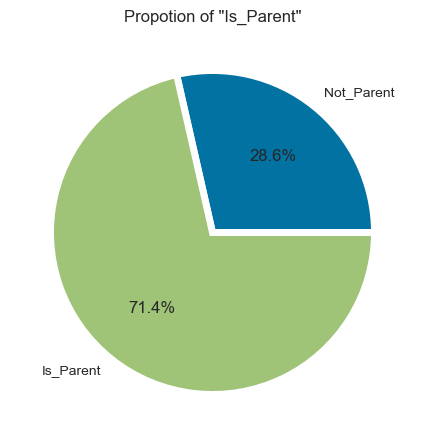

In [18]:
x = data['Is_Parent'].value_counts().sort_values()

plt.figure(figsize=(5, 5))
ax = plt.pie(x = x, labels=['Not_Parent', 'Is_Parent'], autopct = '%1.1f%%', wedgeprops = {'linewidth': 5})
plt.title('Propotion of "Is_Parent"')
plt.style.use(['fivethirtyeight'])
plt.show()

<br>

부모인 고객이 71.4%를 차지하고 있습니다.

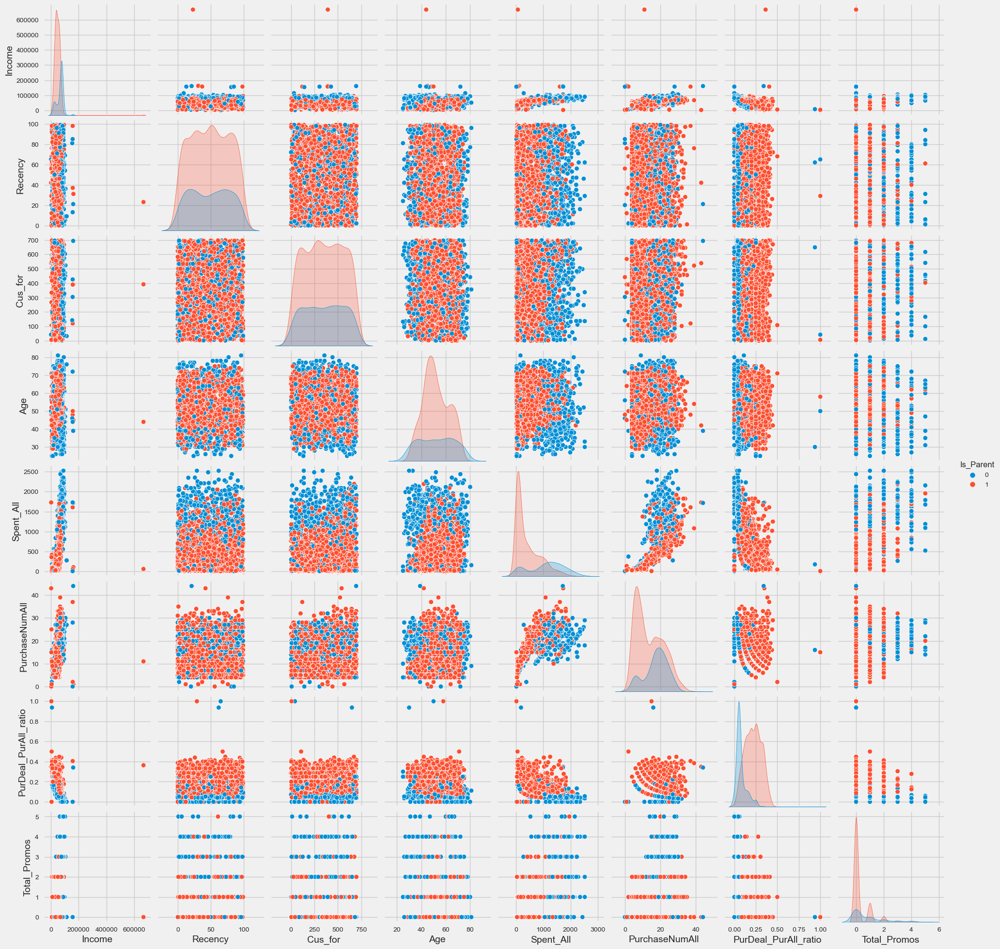

In [19]:
to_plot = ['Income', 'Recency', 'Cus_for', 'Age', 'Spent_All',
           'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos','Is_Parent']

sns.pairplot(data[to_plot], hue = "Is_Parent")
# plt.style.use(['fivethirtyeight'])
plt.show()

<br>

#### `Income`변수 내 아웃라이어 처리

위 pairplot을 통해, `Income`변수 내 아웃라이어가 있어서 변수간 관계가 잘 표현되지 않음을 발견했습니다.

단순 삭제하는 대신에, IQR method를 이용하여 max값으로 대체하였습니다.


<br>

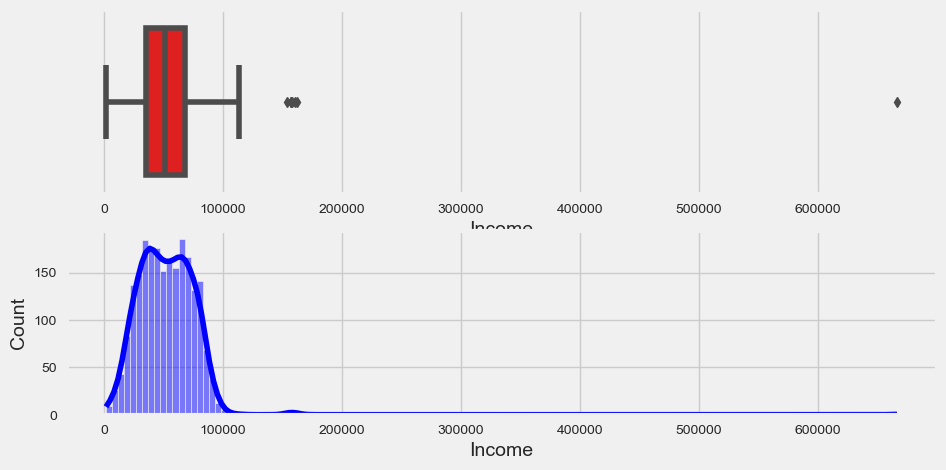

In [20]:
fig, axes = plt.subplots(2, 1, figsize=(10,5))

sns.boxplot(data = data, x = 'Income', color = 'red', ax = axes[0])
sns.histplot(data = data, x = 'Income', kde=True, color='blue', ax = axes[1])
plt.show()

In [21]:
# define the function for capping the outliers

print(f'old shape: {data.shape}')
q1 = data.Income.quantile(0.25)
q3 = data.Income.quantile(0.75)

iqr = q3 - q1

upper_bound = q3 + 1.5*iqr
lower_bound = q1 - 1.5*iqr
print(f'upper bound value: {upper_bound}')
print(f'lower bound value: {lower_bound}')

data.loc[data['Income'] > upper_bound, 'Income'] = upper_bound
data.loc[data['Income'] < lower_bound, 'Income'] = lower_bound

print(f'new shape: {data.shape}, There is no change of the shape.')

old shape: (2213, 32)
upper bound value: 118348.5
lower bound value: -14615.5
new shape: (2213, 32), There is no change of the shape.


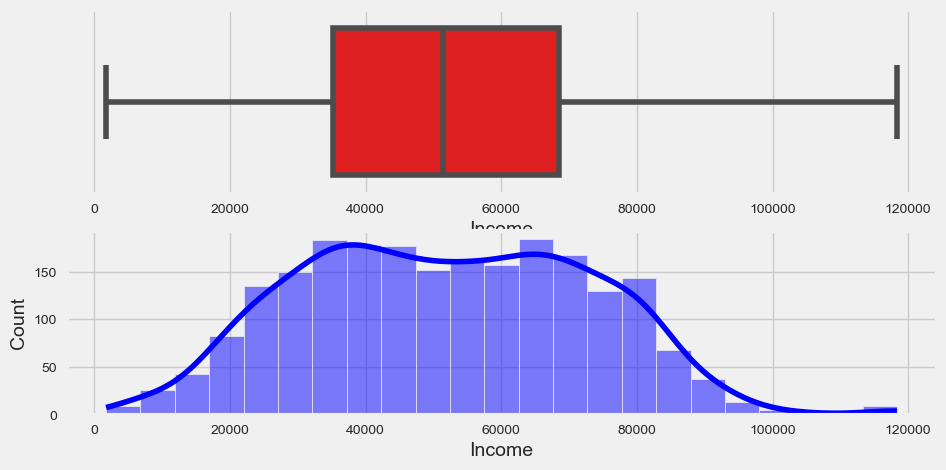

In [22]:
# 박스플롯으로 다시 확인

fig, axes = plt.subplots(2, 1, figsize=(10,5))

sns.boxplot(data = data, x = 'Income', color = 'red', ax = axes[0])
sns.histplot(data = data, x = 'Income', kde=True, color='blue', ax = axes[1])

plt.show()

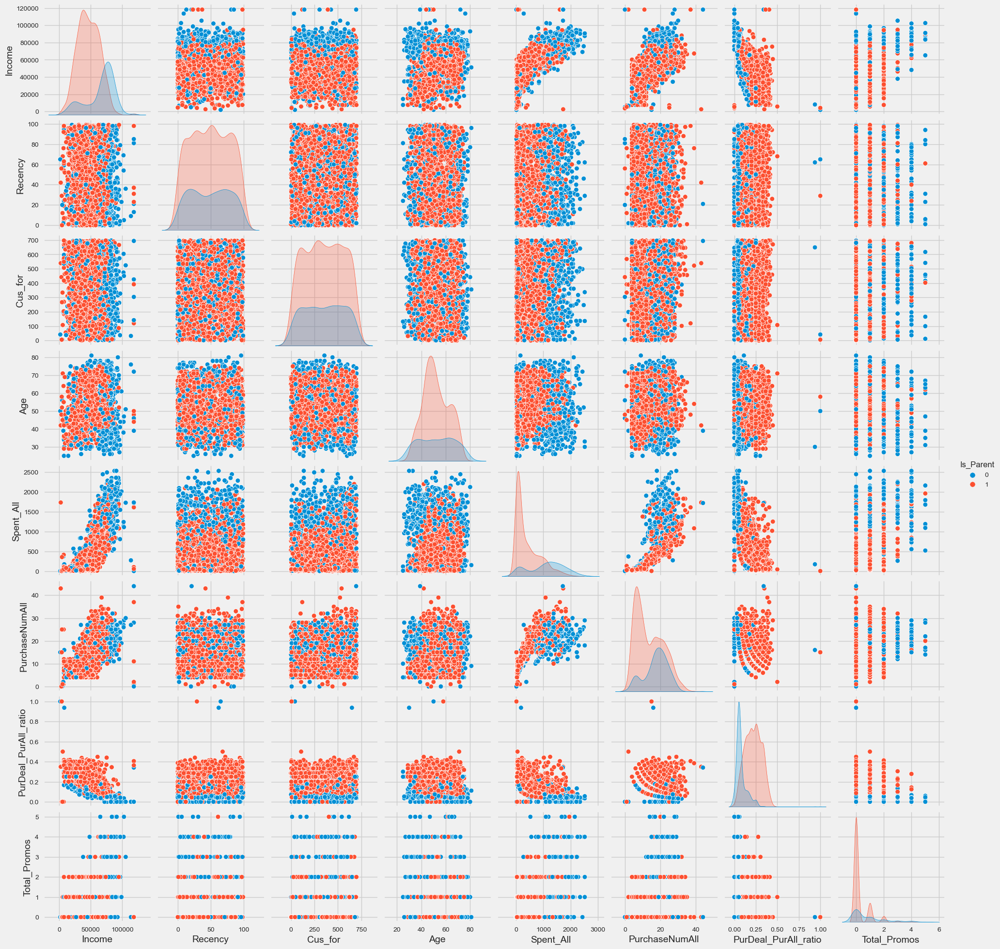

In [23]:
to_plot = ['Income', 'Recency', 'Cus_for', 'Age', 'Spent_All',
           'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos','Is_Parent']

sns.pairplot(data[to_plot], hue = "Is_Parent")

plt.show()

<br><br>

***인사이트***

* **`Is_Parent`변수 비교**
    * `Income`:  부모가 아닌 고객의 소득이 부모인 고객의 소득보다 더 높습니다.
    * `Recency`: 의미있는 차이는 없습니다.
    * `Cus_for`: 의미있는 차이는 없습니다.
    * `Age`: 의미있는 차이는 없습니다.
    * `Spent_All`: 부모가 아닌 고객의 총 소비가 더 높습니다.
    * `PurchaseNumAll`: 의미있는 차이는 없습니다.
    * `PurDeal_PurAll_ratio`: 총 구매에서 할인을 통한 구매가 차지하는 비율이며, 부모고객일수록 명백히 높게 나타납니다.
    * `Total_Promos`: 프로모션에 대한 반응 수이며, 오히려 부모가 아닌 고객이 반응 수가 더 많습니다. 


* **`Income`과 `Spent_All`은 양의 상관관계에 있습니다.**


<br>

<br>

### `Education` 변수

pairplot을 이용하여, 아래의 컬럼들에 대해 차이를 확인하고자 합니다.


* `Income`, `Recency`, `Cus_for`, `Age`, `Spent_All`,  `PurchaseNumAll`, `PurDeal_PurAll_ratio`, `Total_Promos`

<br>

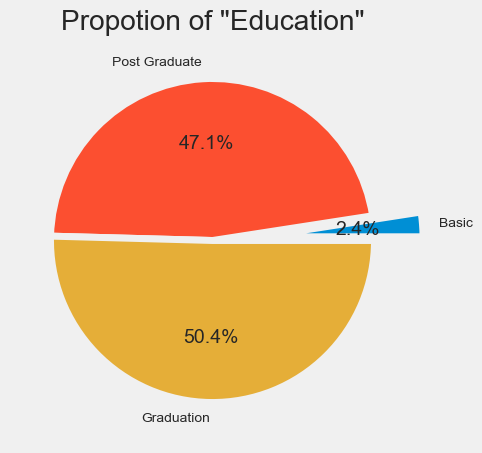

In [24]:
x = data['Education'].value_counts().sort_values()
labels = data['Education'].value_counts().sort_values().index

plt.figure(figsize=(5, 5))
plt.pie(x = x, labels = labels, autopct = '%1.1f%%', wedgeprops = {'linewidth': 5}, explode = [0.3, 0, 0])
plt.title('Propotion of "Education"')
plt.show()

<br>

50.4%가 대학졸업자이며, 대학원 이상도 47.1%로 높은 비중을 차지하고 있습니다.

고객의 대부분이 고학력자입니다. 

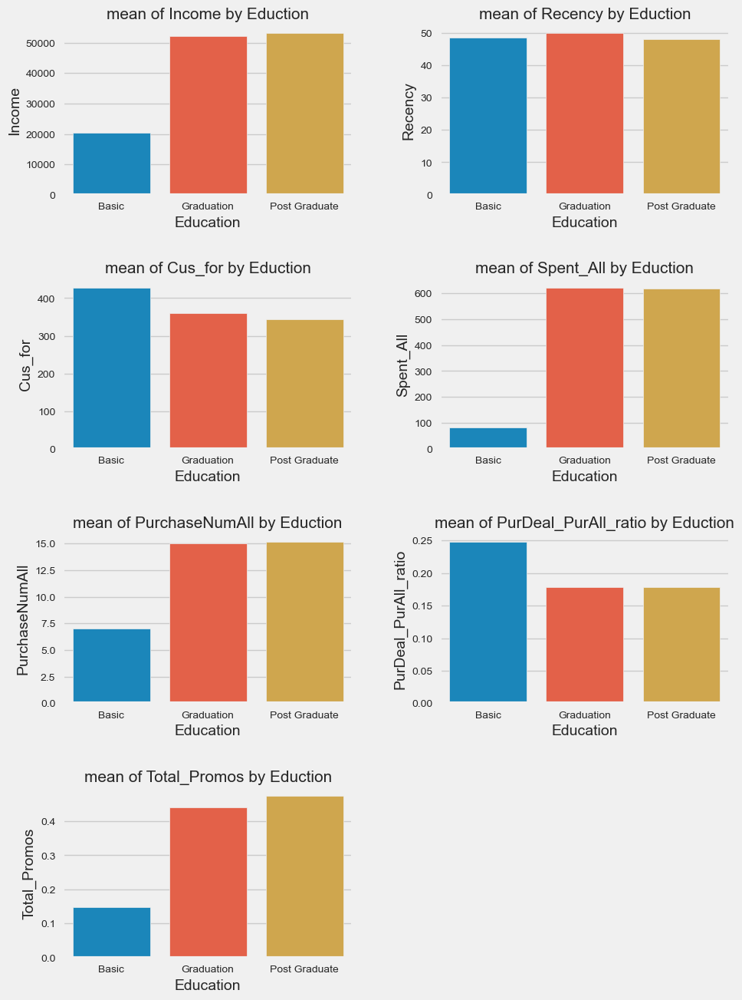

In [25]:
to_barplot = ['Income', 'Recency', 'Cus_for', 'Spent_All', 'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize = (10, 15))
axes = axes.flatten()

for col, ax in zip(to_barplot, axes):
    ax = sns.barplot(data = data, x = 'Education', y = col, ax = ax,
                order = ['Basic', 'Graduation', 'Post Graduate'], ci = None)
    ax.set_title(f'mean of {col} by Eduction', fontsize = 15)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.3)
    
axes[-1].axis('off')    
plt.show()

<br>

교육수준에 따라 여러 변수들의 차이를 확인한 결과, Graduation과 Post Graduate을 나누는 것은 큰 의미가 없는 것으로 보였습니다.

따라서 이 둘을 `Higher`라는 클래스로 합치고, 단순히 `Basic`과 `Higher` 이렇게 두 클래스만으로 분류하였습니다.

In [26]:
# Will unify the Graduation and Post Graduate since there's no meaningful difference btw 2 classes.

data['Education'].replace({"Graduation" : "Higher", 
                           "Post Graduate" : "Higher"}, inplace = True)

<br><br>

***인사이트***


* **`Education`변수 비교**
    * Income: `Basic`과 나머지 두 그룹에서 두 배 이상의 큰 차이를 보입니다.
    * Recency: 의미있는 차이는 없습니다.
    * Cus_for: `Basic` 그룹이 고객으로 더 오래 있었습니다.
    * Spent_All: `Basic`과 나머지 두 그룹에서 6배 이상의 큰 차이를 보입니다.
    * PurchaseNumAll: `Basic`과 나머지 두 그룹에서 두 배 이상의 큰 차이를 보입니다.
    * PurDeal_PurAll_ratio: `Basic`의 경우, 전체 구매에서 할인 구매의 비중이 나머지에 비해 높습니다.
    * Total_Promos: 그러나 프로모션 자체에 대한 민감도는 `Higher`그룹이 더 높습니다.
    

* **`Education`변수는 지출금액 뿐만 아니라 프로모션 민감도를 구분할 수 있는 중요한 변수임을 확인하였습니다.**

<br>

<br>

### `Age` 변수

pairplot을 이용하여, 아래의 컬럼들에 대해 차이를 확인하고자 합니다.


* `Income`, `Recency`, `Cus_for`, `Age`, `Spent_All`,  `PurchaseNumAll`, `PurDeal_PurAll_ratio`, `Total_Promos`

<br>

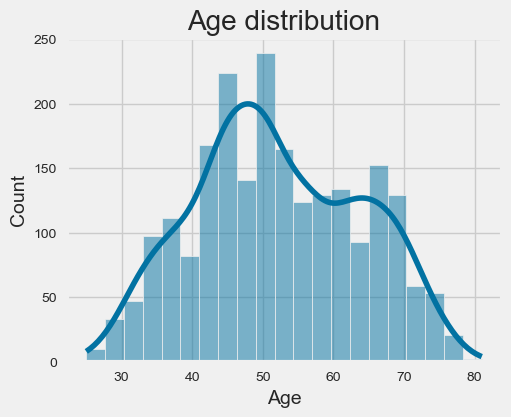

In [27]:
plt.figure(figsize=(5, 4))

sns.histplot(data = data, x = 'Age', kde=True)
plt.title('Age distribution')

plt.show()

<br>

나이가 증가함에 따른 각 변수별 변화를 보고자 lineplot으로 표현하였습니다.

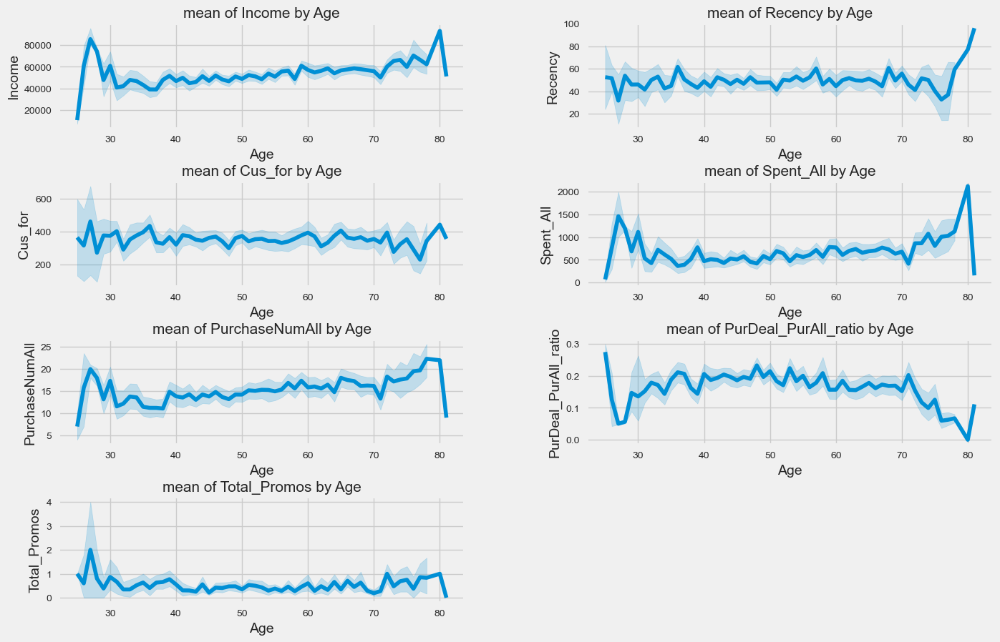

In [28]:
to_lineplot = ['Income', 'Recency', 'Cus_for', 'Spent_All', 'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize = (15, 10))
axes = axes.flatten()

for col, ax in zip(to_lineplot, axes):
    ax = sns.lineplot(data = data, x = 'Age', y = col, ax = ax, )
    ax.set_title(f'mean of {col} by Age', fontsize = 15)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.3)

axes[-1].axis('off')    
plt.show()

<br><br>

***인사이트***

* **`Age`변수 비교**
    * Income: 30세 이전에 높은 소득을 달성한 사람이 있는 것을 제외하면, 점진적으로 나이가 들수록 소득도 올라갔습니다.
    * Recency: 전반적으로 의미있는 차이는 없습니다.
    * Cus_for: 전반적으로 의미있는 차이는 없습니다.
    * Spent_All: 30세 이전의 지출과 70~80세 구간의 지출이 높습니다.
    * PurchaseNumAll: 30세 이전의 구매수와 70~80세 구간의 구매수가 높으며, 대개의 경우 나이가 증가하면서 구매 횟수도 증가합니다. 
    * PurDeal_PurAll_ratio: 전체구매에서 할인 구매가 차지하는 비율은 오히려 30~70세 사이의 구간이 높은 편입니다. 
        
        
* **`Age`변수는 고객의 프로모션 민감도를 구분하는 데 유용한 변수로 판단됩니다. 필요한 경우, 30세 이전의 고객 / 70세 이후의 고객 / 그 외 로 나누어서 세부 분석을 해보는 것도 유용할 것으로 판단됩니다.**

<br>

<br>

### `Living_with` 변수

pairplot을 이용하여, 아래의 컬럼들에 대해 차이를 확인하고자 합니다.


* `Income`, `Recency`, `Cus_for`, `Age`, `Spent_All`,  `PurchaseNumAll`, `PurDeal_PurAll_ratio`, `Total_Promos`

<br>

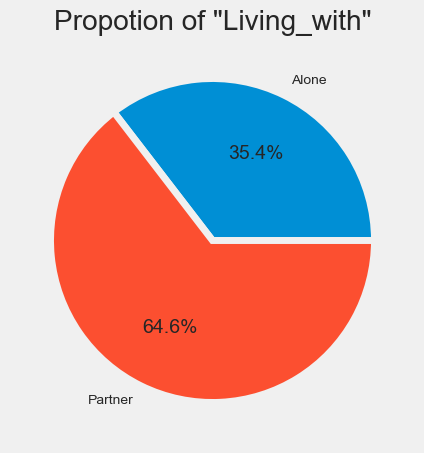

In [29]:
x = data['Living_with'].value_counts().sort_values()
labels = data['Living_with'].value_counts().sort_values().index

plt.figure(figsize=(5, 5))
plt.pie(x = x, labels = labels, autopct = '%1.1f%%', wedgeprops = {'linewidth': 5})
plt.title('Propotion of "Living_with"')
plt.show()

<br>

결혼 혹은 동거를 통해 배우자와 함께 사는 사람이 64.6%를 차지합니다.

배우자 유무에 따른 변수들의 차이는 어떤 게 있을지 살펴보면 다음과 같습니다.

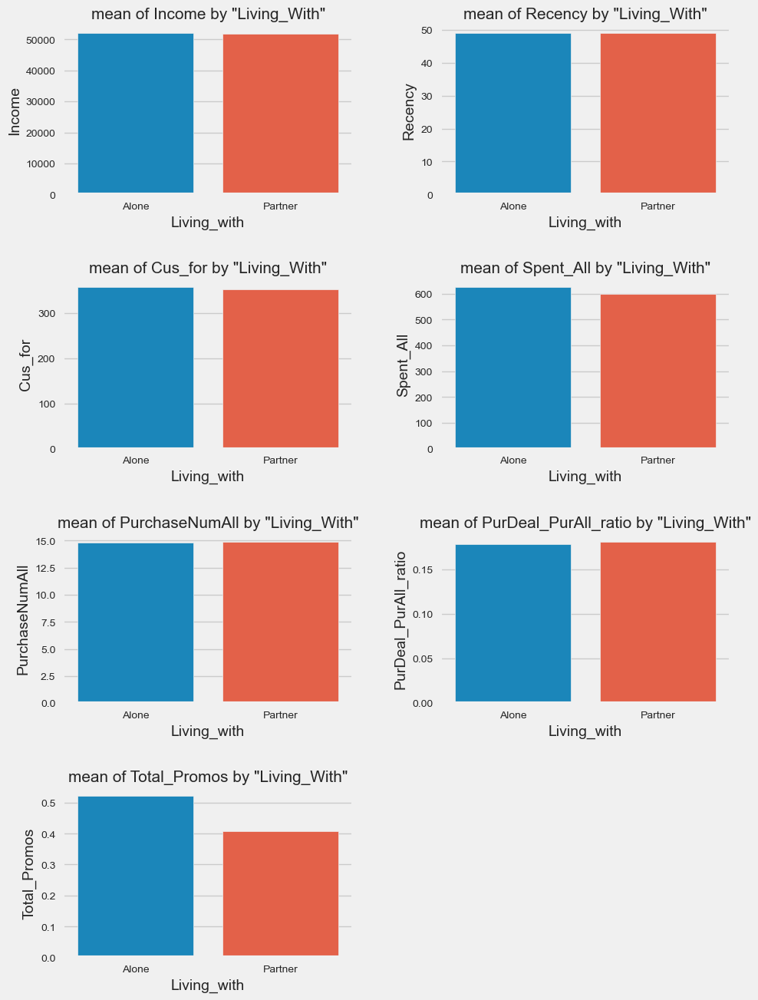

In [30]:
to_barplot = ['Income', 'Recency', 'Cus_for', 'Spent_All', 'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize = (10, 15))
axes = axes.flatten()

for col, ax in zip(to_barplot, axes):
    ax = sns.barplot(data = data, x = 'Living_with', y = col, ax = ax,
                order = ['Alone', 'Partner'], ci = None)
    ax.set_title(f'mean of {col} by "Living_With"', fontsize = 15)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.3)

axes[-1].axis('off')    
plt.show()

<br><br>

***인사이트***

 
* **`Living_with` 변수 비교**
    * 총 프로모션 반응 수를 제외하고는 크게 유의미한 차이를 보이지 않습니다. 그나마도 총 프로모션 반응 수 평균이 0.1 정도밖에 차이나지 않습니다. 
    * 따라서 본 변수는 고객 행동에 큰 영향이 없다고 판단하고 제거하였습니다.

<br>

In [31]:
data.drop(['Living_with'], axis = 1, inplace = True)

display(data.shape, data.head(1))

(2213, 31)

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
0,Higher,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,1,663,64,0,1617,25,0.12,1,1,0


<br>


### 상관관계 분석

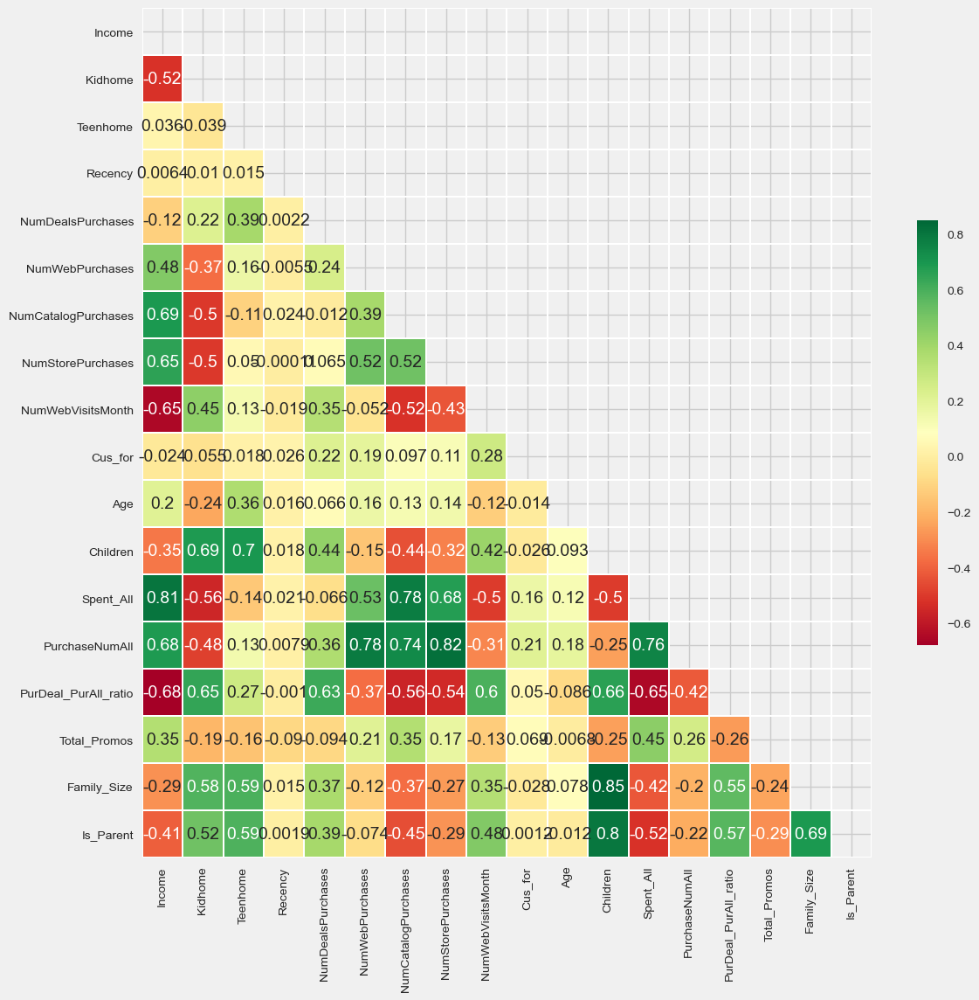

In [32]:
corr_cols = ['Income', 'Kidhome', 'Teenhome', 'Recency', 'NumDealsPurchases', 'NumWebPurchases',
             'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Cus_for', 'Age',
             'Children', 'Spent_All', 'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos','Family_Size', 'Is_Parent']

corr = data[corr_cols].corr()

plt.figure(figsize=(12, 12))

mask = np.zeros_like(corr, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

heat_map = sns.heatmap(corr,
                       annot = True,
                       cmap = 'RdYlGn',
                       mask = mask,
                       linewidths = 0.1,
                       cbar_kws = {'shrink':0.5})

<br><br>

* ***상관관계 분석***
    * `Recency`, `Cus_for`, `Age`를 제외한 대부분의 독립변수들간의 상관관계가 굉장히 높음을 알 수 있습니다.
    * 이 경우 변수간 다중공선성이 생길 우려가 있으므로, 변수 선택 또는 변수 추출을 하는 것이 중요합니다. 추후 본 프로젝트에서는 변수 추출방법인 PCA(주성분 분석)를 시도하였습니다.

<br>

***[목차로 이동](#contents)***

<br><br>

<a id = '3-3'></a>

## 3-3. 다음 분석절차 요약


* **Data 전처리**
    * 범주형 변수 라벨 인코딩
    * 연속형 변수 표준화


* **PCA를 이용한 차원 축소**
    * 적절한 주성분 갯수에 대한 탐색


* **클러스터링**
    * 알고리즘 함수 인자의 적절한 **`K`** 탐색


* **고객 프로파일링**
    * 개인정보 관련 변수: 'Income', 'Age', 'Education', 'Is_Parent', Family_Size', 'Kidhome', 'Teenhome'
    * 구매행동 관련 변수: 'Spent_All', 'PurDeal_PurAll_ratio', 'NumWebVisitsMonth', 'NumCatalogPurchases', 'NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases' 

<br>

* 클러스터링 전, 피벗테이블을 이용한 간단 요약 
    * 부모가 아니면서 고등교육수준의 경우: 매장 방문, 카탈로그, 웹을 이용한 구매가 높으며, 총 구매 대비 할인구매 비율은 굉장히 낮지만 프로모션에 대한 반응은 제일 높습니다. 이 경우, 프로모션 대상 제품은 대부분 낮은 가격인 생필품 위주일 가능성이 높을 것으로 판단됩니다. 
    
    * 부모이면서 기본교육수준의 경우: 매장 구매가 제일 많으며, 총 구매 대비 프로모션 구매비율이 굉장히 높습니다. 그러나 총 구매금액은 제일 낮은 것을 보면, 기초적인 생필품 외에는 구매하지 않을 가능성이 높습니다.

In [33]:
pd.pivot_table(data, index=['Is_Parent', 'Education'],
               values = ['Spent_All', 'PurDeal_PurAll_ratio', 'Total_Promos',
                         'NumWebVisitsMonth', 'NumCatalogPurchases',
                         'NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases'], aggfunc='mean',
               margins= True)

NumCatalogPurchases  NumDealsPurchases  \
Is_Parent Education                                           
0         Basic                 0.529412           1.470588   
          Higher                4.884553           1.133333   
1         Basic                 0.459459           1.945946   
          Higher                1.866580           2.818653   
All                             2.671487           2.325350   

                     NumStorePurchases  NumWebPurchases  NumWebVisitsMonth  \
Is_Parent Education                                                          
0         Basic               3.176471         2.411765           6.764706   
          Higher              7.383740         4.461789           3.406504   
1         Basic               2.702703         1.648649           6.918919   
          Higher              5.279793         4.015544           6.030440   
All                           5.805242         4.087664           5.321735   

                     PurDeal_PurAll_ratio    Spent_All  Total_Promos  
Is_Parent Education                                                   
0         Basic                  0.194484   136.176471      0.058824  
          Higher                 0.076959  1130.819512      0.886179  
1         Basic                  0.272648    56.810811      0.189189  
          Higher                 0.219061   416.753886      0.284974  
All                              0.180277   607.021690      0.448712

<a id = "4"></a>

# 4. 데이터 전처리

* 수치형 변수의 측정단위가 다르기 때문에 표준화 스케일링을 수행하였습니다.

* 범주형 변수를 라벨 인코딩 하였습니다.

* 원본과 별도로 차원축소에 사용할 데이터프레임을 생성했습니다.

 ### Label Encoding

In [34]:
# 이 데이터에는 3가지 특정 데이터 유형이 있습니다.
# 범주형 피처와 숫자 피처를 분리하는 쉬운 방법 중 하나를 소개하겠습니다.

data.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

In [35]:
# "._get_numeric_data()" 메서드를 사용하여 데이터 세트의 숫자 데이터를 추출할 수 있습니다.
# 그 후 집합 계산을 사용하여 범주형 특징의 열을 가져옵니다.

num_cols = data._get_numeric_data().columns
cat_cols = set(data.columns) - set(num_cols)

print(list(cat_cols))

['Education']


In [38]:
num_cols

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Cus_for', 'Age', 'Children', 'Spent_All',
       'PurchaseNumAll', 'PurDeal_PurAll_ratio', 'Total_Promos', 'Family_Size',
       'Is_Parent'],
      dtype='object')

In [45]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

cat_cols = list(cat_cols)

for i in cat_cols:
    data[i] = le.fit_transform(data[i])

data[cat_cols].head()

,Education
0,1
1,1
2,1
3,1
4,1


<br>

### Standardization and Creating a subset dataframe

* Copy the original data.


* 아래 변수들은 `Total_Promos`, `Spent_All`에 집계가 포함된 변수들이므로 삭제하였습니다.
    * `Total_Promos`: 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response'
                
    * `Spent_All`: 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'


<br>

In [53]:
data.head(5)

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
0,1,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,1,663,64,0,1617,25,0.120000,1,1,0
1,1,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,113,67,2,27,6,0.333333,0,3,1
2,1,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,312,56,0,776,21,0.047619,0,2,0
3,1,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,139,37,1,53,8,0.250000,0,3,1
4,1,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,161,40,1,422,19,0.263158,0,3,1


In [54]:
# drop_cols: 'Spent_All'에 대한 세부 열과 'Total_Promos'에 대한 T/F 열입니다.

data_scaled = data.copy()

drop_cols = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response',
             'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
data_scaled.drop(columns = drop_cols, axis = 1, inplace = True)

print(data_scaled.shape)

(2213, 19)


In [55]:
scale_cols = ['Income', 'Kidhome', 'Teenhome', 'Recency',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Cus_for', 'Age', 'Children', 'Spent_All', 'PurchaseNumAll',
       'PurDeal_PurAll_ratio', 'Total_Promos', 'Family_Size']

In [56]:
ss = StandardScaler()

for col in scale_cols:
    data_scaled[col] = ss.fit_transform(data_scaled[[col]])
    
display(data_scaled.shape, data_scaled.head(3))

(2213, 19)

,Education,Income,Kidhome,Teenhome,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
0,1,0.298011,-0.823208,-0.929307,0.310773,0.350656,1.427316,2.504247,-0.555456,0.692198,1.527968,1.018785,-1.264914,1.676723,1.318395,-0.541957,0.617576,-1.758879,0
1,1,-0.262135,1.039532,0.908545,-0.380424,-0.169104,-1.126455,-0.571168,-1.170837,-0.132699,-1.189356,1.275248,1.404857,-0.962927,-1.159238,1.376131,-0.502666,0.448948,1
2,1,0.937994,-0.823208,-0.929307,-0.795142,-0.688863,1.427316,-0.229456,1.290688,-0.545148,-0.206179,0.334882,-1.264914,0.280531,0.796788,-1.192737,-0.502666,-0.654965,0


***[목차로 이동](#contents)***

<a id = "5"></a>

# 5. 주성분분석(PCA)을 이용한 변수 추출

<br>

**PCA(Principal Component Analysis)**

주성분 분석(PCA)은 머신러닝의 비지도학습기법 중 하나로 고차원의 데이터를 저차원으로 축소합니다. 기존 변수의 선형 조합으로 생성된 요약된 변수(주성분)로 데이터를 요약하는 것으로, 원 데이터의 분산을 최대로 보존하는 축을 찾고 그 축에 데이터를 사영(projection)시키는 기법입니다.


<br>

**PCA를 이용하면, 아래의 문제가 해소됩니다.**
1. 차원의 저주
2. 변수간 다중공선성
3. 시각화 표현

<br>

**PCA 와 K-Means Clustering의 결합**
차원을 축소한 데이터를 이용하여 머신러닝 알고리즘을 수행하면 연산 cost를 줄일 수 있고, 거리를 기반으로 하는 머신러닝 기법(K-Means Clustering, KNN 등)은 데이터의 분포나 변수 간 상관관계에 영향을 많이 받게 되는 점을 고려하면 클러스터링 분석 시 PCA를 사용하는 것은 합리적이라고 할 수 있습니다.

<br>

**PCA의 파라미터**

* **`n_components`**: 몇 개의 차원으로 축소할 것인지를 결정하는데, 통상적으로 아래의 3가지 방법 중 선택적으로 사용합니다.


1. **the Scree plot을 이용한 선택법(Elbow method)**: 주성분이 늘어감에 따라 고유값(eigen value)이 유의미하게 감소하는 elbow point에 해당하는 주성분 수를 선택 --> 사용자가 주관적으로 선택한다는 단점이 있으므로, 아래의 방법들과 함께 사용하였습니다.


2. **Kaiser's Rule**: `PCA().fit(your data)`을 통해 데이터의 차원 축소를 수행한 뒤, `.explained_variance_` 속성을 이용하여 각 주성분의 고유값(eigen value)을 알 수 있습니다. 카이저 규칙은, 고유값이 1을 초과하는 주성분들만 선택하는 방식인데, 요인의 수를 고려하지 않는 지나치게 엄격한 관습적인 방법으로 인해 1번과 3번의 방법과 함께 참고로만 사용하는 것을 권장하고 있습니다. 


3. **분산비율 선택법**: 전체 데이터에서 최소 70% 이상의 설명력을 가지는 주성분 갯수를 선택하는 방법입니다.

<br><br>

**PCA 수행 과정**

1. 데이터의 공분산 행렬 생성
    * 공분산행렬은 "변수갯수 X 변수갯수"의 shape를 갖습니다.
    * 본 프로젝트에서는, 위에서 생성한 **`data_scaled`**를 사용하므로, 공분산행렬은 19 X 19의 shape를 갖게 됩니다.
    
    
2. 공분산행렬로부터 상관관계행렬 생성
    * shape는 동일하게 19 x 19 입니다.
    
    
3. 고유값(eigenvalue)과 그에 대한 고유벡터(eigenvector) 반환
    * 상관관계행렬의 shape에 따라 19개의 고유값이 반환되고, 각 고유값에 대해 19개의 고유벡터가 반환됩니다.
    * 각 고유값은 각 주성분의 분산에 해당하며, 각 고유벡터는 해당 주성분 내의 변수별 계수가 되며 loading이라고도 불립니다.


4. 적절한 주성분 갯수 선택 후 데이터에 PCA 알고리즘 적용
    * 앞서 언급한 3가지 방법을 이용합니다.
    
    
5. 고유벡터를 이용하여 원 변수 값을 변환한 데이터 반환
    * 고유벡터와 기존 데이터 변수 값의 연산을 통해 원래의 변수별 값이 변환되며, 이렇게 변환된 값을 가진 각 변수들은 서로 독립(공분산 0)이 되어 변수간 다중공선성 문제를 해소할 수 있습니다.

<br>

## 주성분 갯수 선택

In [57]:
data_scaled.head(2)

,Education,Income,Kidhome,Teenhome,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Cus_for,Age,Children,Spent_All,PurchaseNumAll,PurDeal_PurAll_ratio,Total_Promos,Family_Size,Is_Parent
0,1,0.298011,-0.823208,-0.929307,0.310773,0.350656,1.427316,2.504247,-0.555456,0.692198,1.527968,1.018785,-1.264914,1.676723,1.318395,-0.541957,0.617576,-1.758879,0
1,1,-0.262135,1.039532,0.908545,-0.380424,-0.169104,-1.126455,-0.571168,-1.170837,-0.132699,-1.189356,1.275248,1.404857,-0.962927,-1.159238,1.376131,-0.502666,0.448948,1


In [58]:
variance_ratio = {}

for i in range(1, len(data_scaled.columns)+1):
    pca = PCA(n_components=i)
    pca.fit(data_scaled)
    variance_ratio[f'n_{i}'] = pca.explained_variance_ratio_.sum()

In [59]:
# 누적 분산 비율을 구합니다.
# 예를 들어, 구성 요소 수를 10으로 선택하면 PCA로 적합된 변수가 데이터를 94%까지 설명할 수 있습니다.
variance_ratio

{'n_1': 0.37862612747558694,
 'n_2': 0.5487776471338204,
 'n_3': 0.6384336529329633,
 'n_4': 0.7003198439922234,
 'n_5': 0.7589202496678894,
 'n_6': 0.809901470422127,
 'n_7': 0.8516806838135464,
 'n_8': 0.8905721035039833,
 'n_9': 0.9210430858152714,
 'n_10': 0.9444620526194528,
 'n_11': 0.9610899877396553,
 'n_12': 0.9736017239360265,
 'n_13': 0.9847352040141362,
 'n_14': 0.9921446440689049,
 'n_15': 0.9956861009068625,
 'n_16': 0.9987406775579519,
 'n_17': 0.9999999999999999,
 'n_18': 0.9999999999999999,
 'n_19': 0.9999999999999999}

<br>

5개의 주성분까지만 시험적으로 살펴보았습니다.

* 각 주성분(PC)당 19개(변수의 수)의 고유벡터가 생성되며, 이들을 loading으로도 불립니다.

* loading은 각 주성분의 생성에 변수들이 얼마만큼 기여했는지를 나타내는 계수입니다.

* 예를 들어, 첫번째 주성분의 경우 `PurDeal_PurAll_ratio`와 `Kidhome`변수가 주성분 생성에 가장 크게 기여했습니다.

In [63]:
# 각 pc당 고유벡터
data_pca5 = pd.DataFrame(pca.components_[0:5],
                         columns=data_scaled.columns,
                         index = ['PC1','PC2','PC3', 'PC4', 'PC5']).T

data_pca5

,PC1,PC2,PC3,PC4,PC5
Education,-0.007750,0.014374,-0.015880,0.009478,0.005309
Income,-0.325759,0.131828,-0.189088,0.162490,0.136333
Kidhome,0.297026,0.025137,0.086160,0.300680,0.336018
Teenhome,0.091827,0.435808,-0.336000,-0.068599,-0.163350
Recency,0.000570,0.016022,-0.049364,-0.609529,0.677934
NumDealsPurchases,0.094359,0.429717,0.277678,0.014706,0.081504
NumWebPurchases,-0.212193,0.311705,0.177664,-0.055184,-0.084338
NumCatalogPurchases,-0.313294,0.098697,0.026731,0.108272,0.162605
NumStorePurchases,-0.289190,0.204709,-0.007577,-0.037869,0.068371
NumWebVisitsMonth,0.253189,0.103311,0.406316,-0.112953,-0.201259


<br>
히트맵을 이용하여 각 변수별 주성분 생성에 대한 기여도를 쉽게 파악할 수 있었습니다.

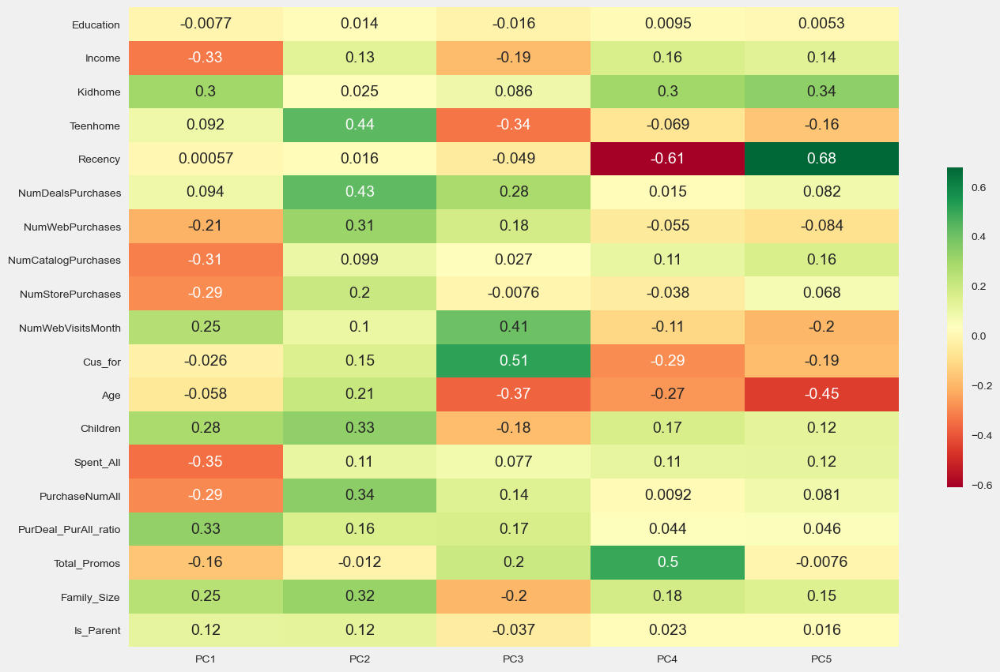

In [64]:
# 각 로딩에 대한 히트맵(각 주성분 대비 고유 벡터의 요소 값)

plt.figure(figsize=(14, 10))
sns.heatmap(data_pca5,
            annot=True,
            cmap='RdYlGn',
            cbar_kws={'shrink' : 0.5}           
           )

plt.show()

<br>

### Elbow Method 와  Kaiser's Rule 수행

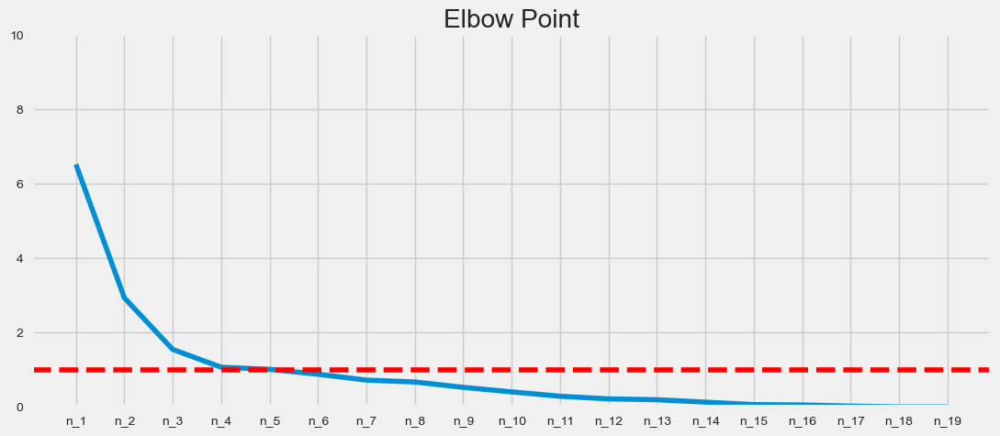

In [65]:
# eigen value
# 주성분의 수를 증가시킬 때 누적 설명 분산 비율이 어느 지점에서 급격하게 상승하면, 그 지점을 "엘보우"로 생각하고 해당 지점에서 주성분의 수를 선택한다.
# 즉, 누적 설명 분산 비율이 급격하게 증가하는 부분을 찾아서 그 부분에서 주성분의 수를 선택함으로써 주성분의 수를 결정한다.


eigen_value = np.sort(pca.explained_variance_)[::-1]

plt.figure(figsize=(12, 5))

plt.plot(variance_ratio.keys(), eigen_value)
plt.ylim(0, 10, 1)
plt.axhline(1, color = 'red', ls = '--')
plt.title('Elbow Point')

plt.show()

In [67]:
eigen_value

array([6.52585624e+00, 2.93266702e+00, 1.54527689e+00, 1.06664690e+00,
       1.01001435e+00, 8.78692972e-01, 7.20090666e-01, 6.70317750e-01,
       5.25186287e-01, 4.03640424e-01, 2.86592779e-01, 2.15647537e-01,
       1.91892437e-01, 1.27706297e-01, 6.10392060e-02, 5.26475239e-02,
       2.17052037e-02, 4.61362590e-31, 2.46746392e-31])

### Kaiser's Rule(카이저 규칙):
    - Kaiser's Rule은 주성분 분석에서 고유값(eigenvalue)을 사용하여 주성분의 수를 결정하는 방법이다.
    - 주성분 분석을 수행하고 고유값을 얻은 후, 고유값이 1보다 큰 주성분만 선택한다.
    - 일반적으로 고유값이 1보다 큰 주성분은 데이터의 분산을 상당히 설명할 수 있는 주성분으로 간주된다.
    - 따라서 Kaiser;s Rule은 고유값이 1보다 큰 주성분의 수를 주성분의 수로 선택한다.

In [68]:
print(f'the number of eigenvalue greater than one: {len(eigen_value[eigen_value > 1])}')

the number of eigenvalue greater than one: 5


<br>

elblow 방법을 이용하면 주성분은 4개가 적절해 보이지만 카이저 규칙으로는 5개의 주성분이 적절합니다.

따라서 분산비율선택법도 함께 수행하여 선택의 근거를 추가하였습니다.


<br>

<br>

### 분산비율 선택법 수행

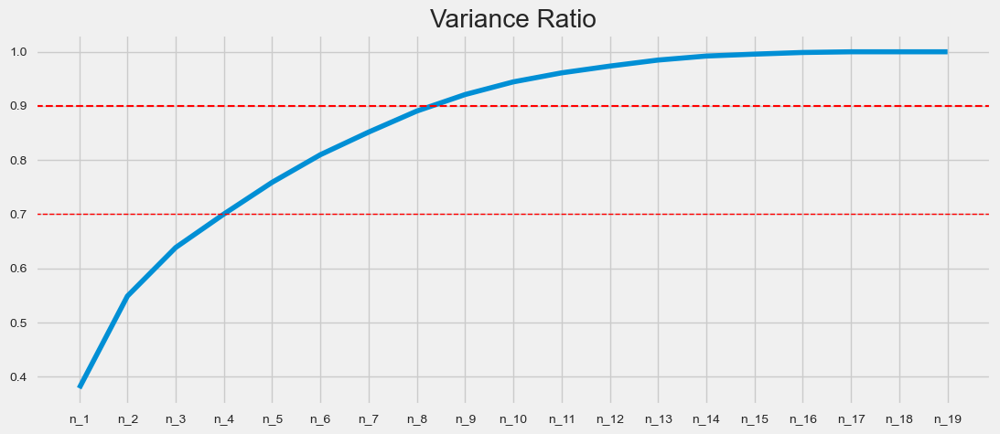

In [70]:
plt.figure(figsize = (12, 5))

plt.plot(variance_ratio.keys(), variance_ratio.values())
plt.axhline(0.7, color = 'red', ls = '--', lw = 1)
plt.axhline(0.9, color = 'red', ls = '--', lw = 1.5)
plt.title("Variance Ratio")

plt.show()


이론적으로 분산비율은 적어도 70% 이상을 요구하고 있습니다. 주성분 4개의 경우 거의 70%이기 때문에 확실히 70% 이상의 분산 설명력을 갖도록 5개의 주성분을 선택하는 것이 적절하다고 판단됩니다.

따라서 아래와 같이 5개의 주성분을 이용하여 차원 축소 및 값 변형된 새로운 데이터 프레임을 생성하였습니다.



In [71]:
pca = PCA(n_components = 5, random_state = 42)

pca.fit(data_scaled)
data_pca = pd.DataFrame(pca.transform(data_scaled), 
                        columns = (["PC1", "PC2", "PC3", "PC4", "PC5"]))

data_pca.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,2213.0,1.926460e-17,2.554576,-6.010222,-2.150347,0.388363,2.326458,7.961499
PC2,2213.0,-1.284307e-17,1.712503,-4.084417,-1.333313,-0.239840,1.164525,6.921793
PC3,2213.0,1.605383e-18,1.243092,-3.736669,-0.875208,0.008542,0.878684,7.517647
PC4,2213.0,-2.809421e-17,1.032786,-3.186183,-0.693398,-0.041606,0.632455,4.055859
PC5,2213.0,-2.086999e-17,1.004995,-3.196596,-0.688522,0.040025,0.707628,4.187204


***[목차로 이동](#contents)***

<a id = "6"></a>

# 6. K-Means clustering을 이용한 고객 세분화


**아래의 3단계에 따라 수행하였습니다.**


* **K-means clustering의 최적의 `K`값 결정**
    * **`Elbow method`**: `K`값의 변화에 따른 Sum Sqaured Error의 추이 확인
    * **`Silhouette method`**[Link](https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c): `K`값 변화에 따른 실루엣 스코어 확인


* **클러스터링 수행**
    * **`Agglomerative(hierachical)`**: 계층적 군집화의 경우, 거주자 데이터(주, 시, 블록 등으로 구분) 등 순차적이고 계층적으로 구별해야 하는 경우에 보다 유용합니다.
    * **`K-Means`**: 정해진 `K`에 따라 동시에 군집하기 때문에 일반적인 데이터에 유용합니다. 따라서 본 데이터는 **`K Means Clustering`**으로 수행하였습니다.
    
    
* **시각화**
    * 클러스터링의 적절함을 시각화를 이용하여 확인하였습니다.

<br>

## 최적의  **`K`** 값 결정

<br>

**1. Elbow method**

* SSE(Sum Sqaured Error) method라고도 알려져 있습니다.
    * returns distortion score when using `KElbeowVisualizer`, and it is equal to SSE.


* 단점: 클러스터 내의 거리는 잘 반영하나, 클러스터 간의 거리는 반영하지 않는다는 단점이 있습니다.

* elbow method를 통한 최적 `K`는 4이지만, **클러스터 간 거리까지 고려하기 위해 추가적으로 실루엣 점수 기법을 이용하였습니다.**

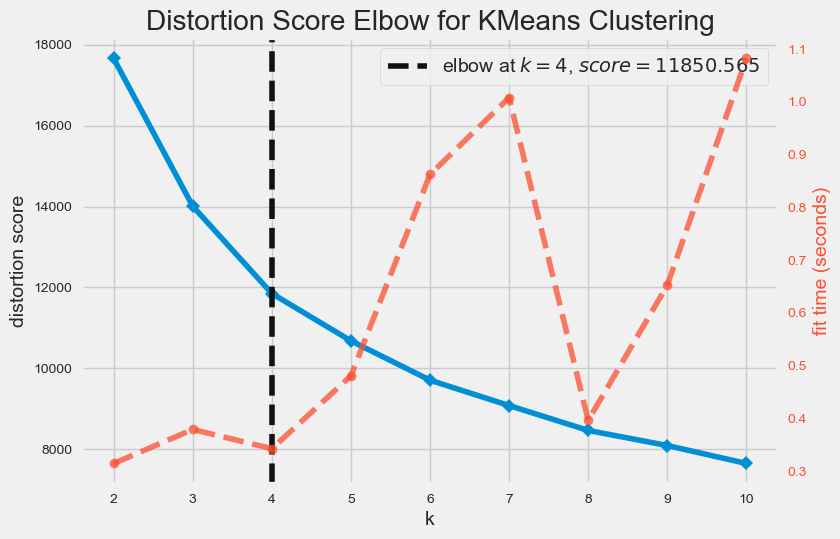

In [72]:
km = KMeans()
Elbow_M = KElbowVisualizer(estimator = km, k = 10)
Elbow_M.fit(data_pca)
Elbow_M.show()

plt.show()

<br>

2. Silhouette method
 
* 실루엣 점수는 클러스터 내의 거리와 클러스터 간 거리를 동시에 고려하여 산출되며, 높을수록 좋습니다.


* 대개의 경우에 실루엣 점수가 두번째로 높은 것을 선택하는 것이 경험적으로 좋은 결과를 가져온다고 알려져 있습니다. 따라서 K-means의 `K`는 3으로 결정하도록 하겠습니다.

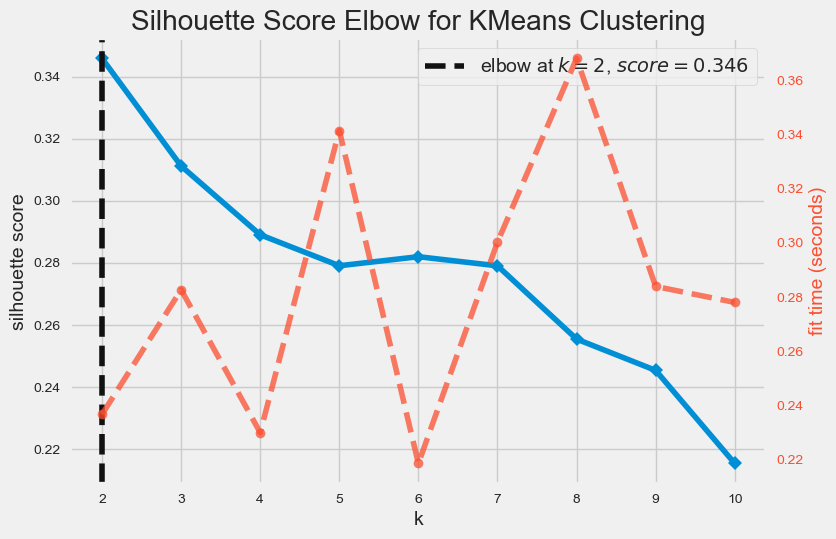

In [73]:
km = KMeans()
Elbow_M = KElbowVisualizer(estimator = km, k = 10, metric='silhouette')
Elbow_M.fit(data_pca)
Elbow_M.show()

plt.show()

In [74]:
def visualize_silhouette_layer(data):
    clusters_range = range(2,10)
    results = []

    for i in clusters_range:
        km = KMeans(n_clusters=i, random_state=42)
        cluster_labels = km.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        results.append([i, silhouette_avg])

    result = pd.DataFrame(results, columns=["n_clusters", "silhouette_score"])
    pivot_km = pd.pivot_table(result, index="n_clusters", values="silhouette_score")

    plt.figure()
    sns.heatmap(pivot_km, annot=True, linewidths=1, fmt='.3f', cmap='RdYlGn')
    plt.tight_layout()
    plt.show()

이 코드는 군집화(Clustering) 결과를 시각화하여 최적의 군집 수를 결정하는 데 도움을 주는 함수입니다. 주로 실루엣 점수(Silhouette Score)를 사용하여 군집의 품질을 평가하고, 여러 군집 수에 대한 실루엣 점수를 시각화합니다.

silhouette_avg = silhouette_score(data, cluster_labels): 실루엣 점수를 계산합니다.
result: 군집 수와 실루엣 점수를 저장한 결과를 DataFrame으로 변환합니다.


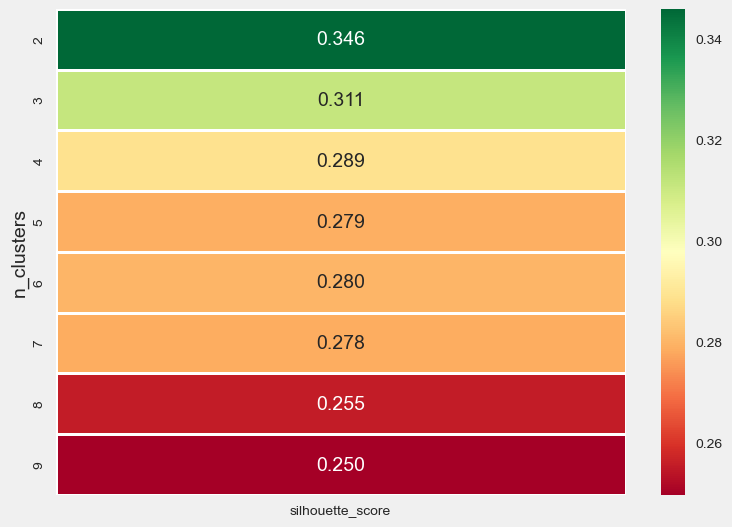

In [75]:
visualize_silhouette_layer(data_pca)

In [79]:
# k=3으로 클러스터링 수행

km = KMeans(n_clusters=3, random_state=42)

yhat_AC = km.fit_predict(data_pca)

data_pca["Clusters"] = yhat_AC   
data["Clusters"]= yhat_AC        

<br>

3. 시각화 확인

아래와 같이 3차원 및 2차원으로 군집 결과를 확인하였습니다.

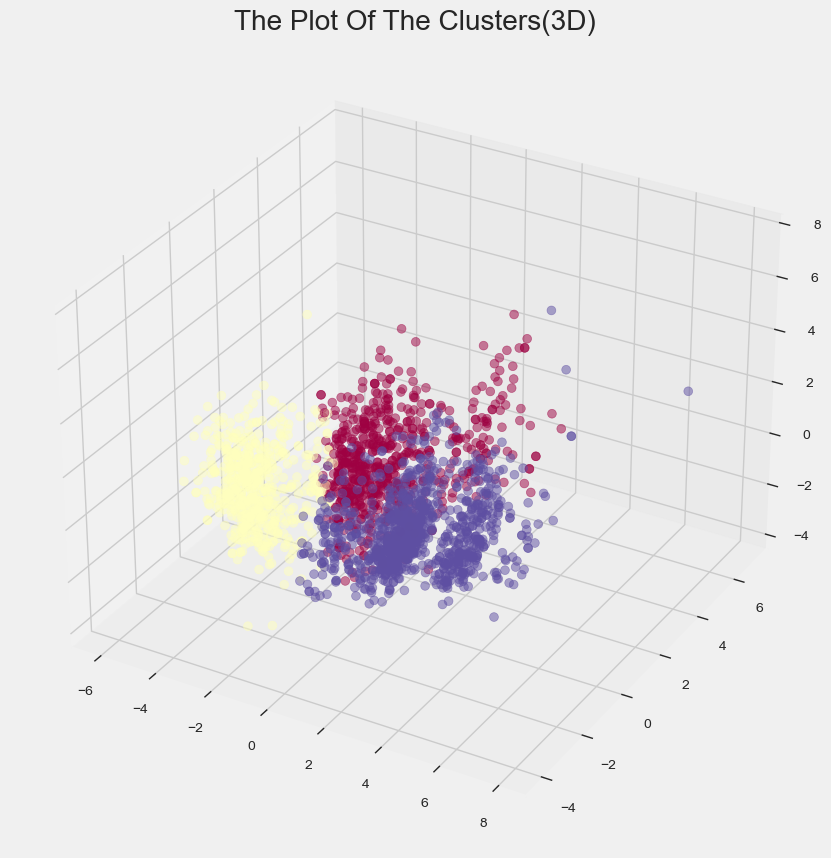

In [80]:
# 3 dimension

x =data_pca["PC1"]
y =data_pca["PC2"]
z =data_pca["PC3"]

fig = plt.figure(figsize=(12,10))
ax = plt.subplot(111, projection='3d')
ax.scatter(x, y, z, s=40, c=data_pca["Clusters"], marker='o', alpha = 0.5, cmap = 'Spectral')
ax.set_title("The Plot Of The Clusters(3D)")

plt.show()

- 주성분 분석(PCA)를 통해 데이터가 3개의 주성분(PC1, PC2, PC3)으로 표현됩니다.(이 주성분안에 피쳐의 특성이 들어있다)
- PC1, PC2, PC3는 기존 데이터의 선형 조합으로 이루어진 주요 구성 요소입니다.
- 이렇게 얻은 주성분을 기반으로 3차원 공간에서 데이터를 시각화하고, 데이터를 클러스터링합니다.
- 데이터를 3차원으로 표현하여 클러스터링 결과를 시각적으로 확인할 수 있습니다.

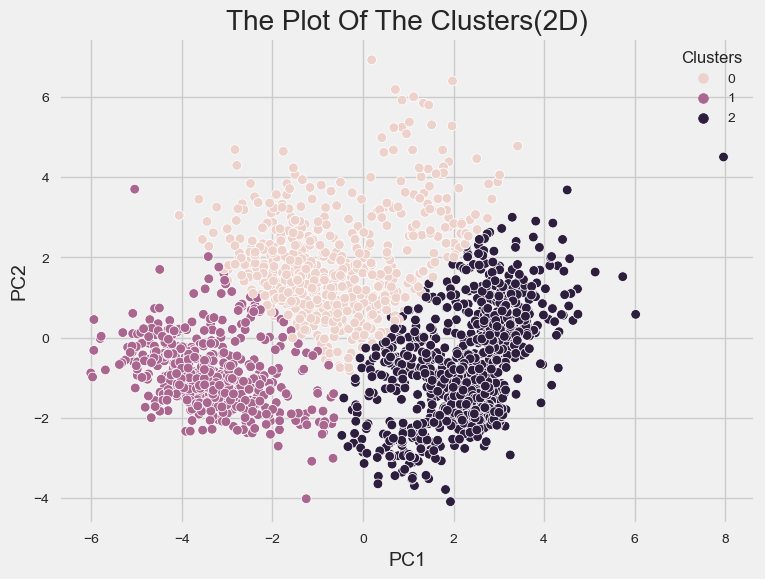

In [81]:
# 2 dimension

plt.figure(figsize=(8,6))

sns.scatterplot(data = data_pca, x = 'PC1', y='PC2', hue='Clusters')
plt.title('The Plot Of The Clusters(2D)')
plt.show()

***[목차로 이동](#contents)***

<br>

<a id = "7"></a>

# 7. 고객 프로파일링

<br>

<a id = '7-1'></a>

## 7-1. 클러스터 요약

각 클러스터는 다음과 같이 표현하였습니다.

```python
{"클러스터 0" : "C0", "클러스터 1" : "C1", "클러스터 2" : "C2"}
```

### 클러스터별 인원

클러스터 0, 1, 2에 각각 아래와 같이 포함되었음을 알 수 있습니다.

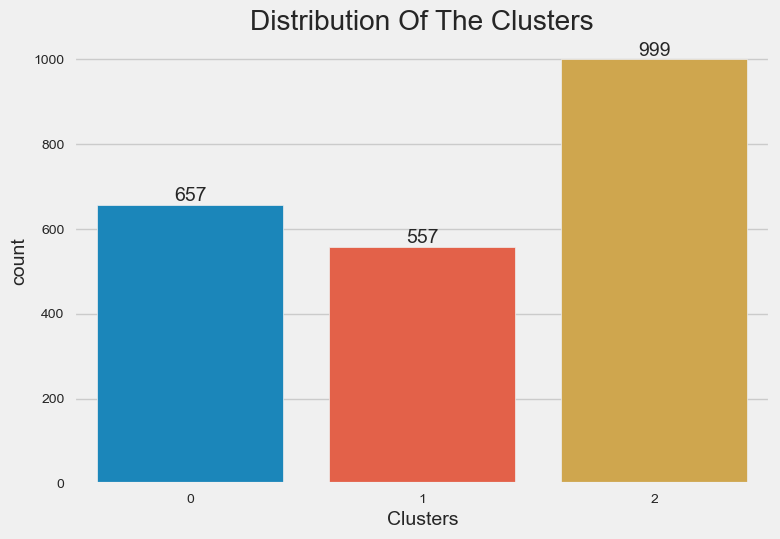

In [83]:
# Plotting countplot of clusters

ax = sns.countplot(x=data["Clusters"])
ax.bar_label(ax.containers[0])
ax.set_title("Distribution Of The Clusters")
plt.show()

<br>

### 클러스터별 소득

Income: C2 < C0 < C1

C2 의 소득이 가장 낮고, C1 의 소득이 가장 높습니다.


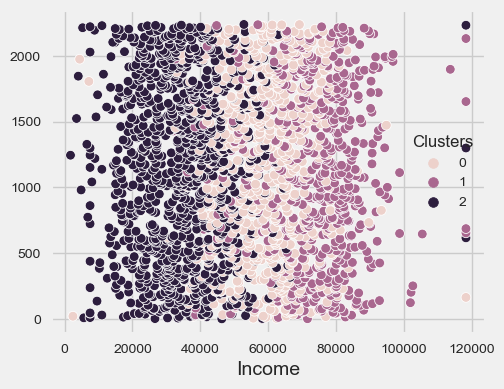

In [85]:
plt.figure(figsize=(5, 4))

sns.scatterplot(data = data, x = data['Income'], y = data.index, hue = 'Clusters')

plt.show()

<br>

### 클러스터별 구매 횟수

`PurchaseNumAll`: C2의 구매횟수가 가장 적은 것을 알 수 있으나, C0과 C1의 차이는 두드려져 보이지 않습니다. 이 경우 `Spent_All`변수를 이용하여 클러스터 당 구매 금액을 살펴보는 것도 유용할 것 같습니다.

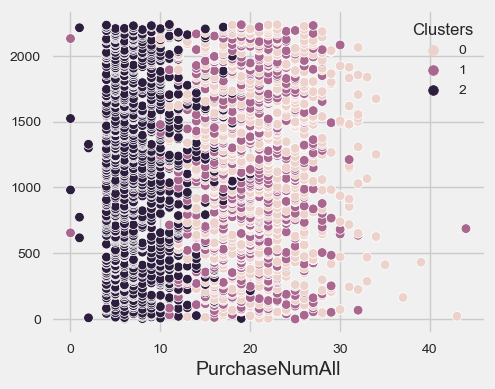

In [86]:
plt.figure(figsize=(5, 4))

sns.scatterplot(data = data, x = data['PurchaseNumAll'], y = data.index, hue = 'Clusters')

plt.show()

<br>

### 클러스터별 구매 금액

`Spent_All`: C2 < C0 < C1

구매 횟수보다는 구매 금액으로 보았을 때 C0와 C1의 차이가 잘 보이는 것을 알 수 있습니다. 

즉, C0과 C1은 구매 횟수는 거의 비슷하지만 C1의 고객들이 더 많은 금액의 소비를 하는 것을 확인하였습니다.

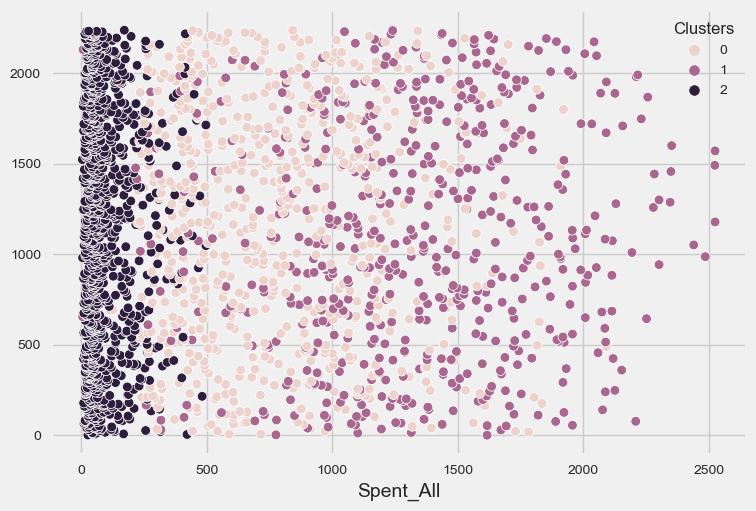

In [87]:
plt.figure()

sns.scatterplot(data = data, x = data['Spent_All'], y = data.index, hue = 'Clusters')

plt.show()

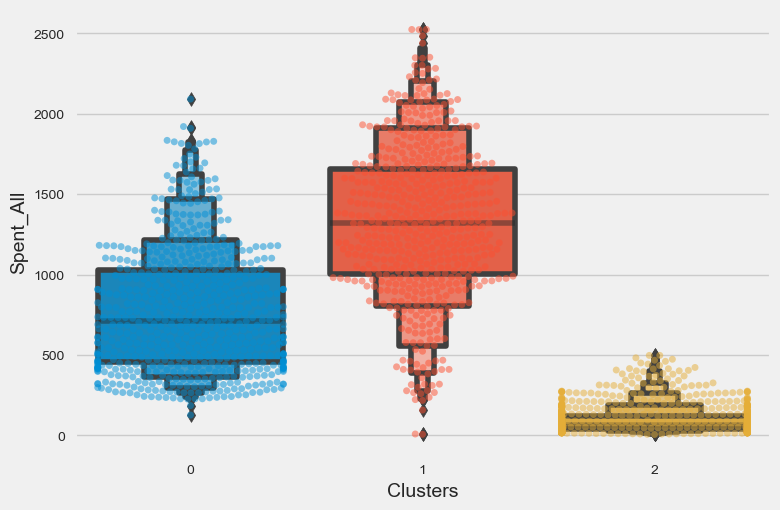

In [88]:
plt.figure()
pl=sns.swarmplot(x=data["Clusters"], y=data["Spent_All"], alpha=0.5 )
pl=sns.boxenplot(x=data["Clusters"], y=data["Spent_All"])
plt.show()

<br>

### 클러스터별  `Spent_All` 과 `Income` 관계 

구매금액이 클수록 소득도 높으며, 각 클러스터별로 구분이 어느 정도 잘 되는 모습을 보이고 있습니다.

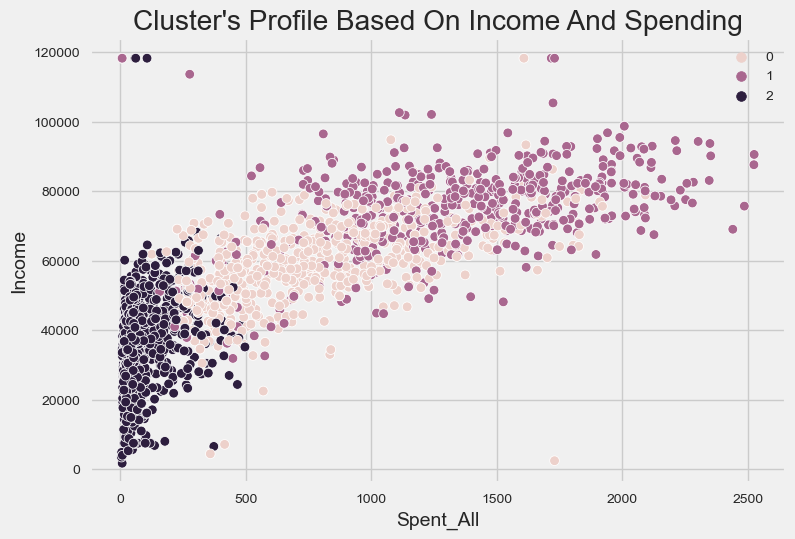

In [90]:
ax = sns.scatterplot(data = data,x=data["Spent_All"], y=data["Income"],hue=data["Clusters"])
ax.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

<br><br>

<a id = "7-2"></a>

## 7-2. 클러스터별 구매행동

본 섹션에서는 클러스터별 구매행동과 할인/프로모션 민감도를 확인하였습니다. `Is_parent(부모여부)` 변수가 매우 중요한 변수였던 점을 감안하여 이 변수를 이용하여 다음의 변수들을 분석하였습니다.


* 구매행동: `NumWebVisitsMonth`, `NumCatalogPurchases`, `NumStorePurchases`, `NumWebPurchases`


* 할인/프로모션 민감도: `NumDealsPurchases`, `PurDeal_PurAll_ratio`, `Total_Promos`

<br>

### 구매행동

아래의 피벗 테이블을 통하여 다음과 같이 해석할 수 있습니다.


* `Cluster 0 - Is_parent`:
    * C0에 속하면서 부모인 고객들은 부모가 아닌 고객들에 비해 카탈로그나 웹 구매 수가 많지만, 못지않게 매장에서 직접 구매하는 행동도 보이고 있습니다. 또한 부모인 고객들이 지난달 웹사이트 방문횟수가 1.1회 더 많음을 알 수 있습니다. 
    * C0과는 반대로, C1에 속하면서 부모인 고객들은 부모가 아닌 고객에 비해 매장 방문을 더 많이 합니다. 카탈로그 구매는 2배 이상의 차이를 보이고 있습니다. 또한 상대적으로 부모일 경우 웹사이트 방문횟수가 적지만 C0의 부모들에 비하면 많이 방문하고 웹구매도 적지않게 하고 있음을 알 수 있습니다. 

    
* `Cluster 1 - Is_parent`:
    * C0에 속하면서 부모인 고객들은 부모가 아닌 고객들에 비해 카탈로그나 웹 구매 수가 많지만, 못지않게 매장에서 직접 구매하는 행동도 보이고 있습니다. 또한 부모인 고객들이 지난달 웹사이트 방문횟수가 1.1회 더 많음을 알 수 있습니다. 
    
* `Cluster 2 - Is_parent`:
    * C2에서는 부모 여부에 대해 큰 차이점은 찾지 못했습니다. 다만 다른 클러스터 대비 전반적으로 구매 횟수는 굉장히 적은 데 비해서 웹사이트 방문횟수는 많음을 알 수 있습니다.
    
   
<br>   
    
***인사이트***

* 같은 부모 이더라도, 소득 수준 등 다른 클러스터에 따라서 구매행동이 다르게 나타났습니다. 각 경로별 쿠폰/행사 알림 등에서 본 클러스터링이 유의미한 역할을 할 것으로 생각됩니다.

In [91]:
Places =["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases",  "NumWebVisitsMonth"] 

pd.pivot_table(data = data, index = ['Clusters', 'Is_Parent'], values = Places, margins=True)

NumCatalogPurchases  NumStorePurchases  NumWebPurchases  \
Clusters Is_Parent                                                            
0        0                     1.500000           6.125000         7.375000   
         1                     3.335901           7.818182         6.345146   
1        0                     5.734893           8.185185         4.912281   
         1                     6.340909           8.204545         5.750000   
2        0                     0.531532           3.126126         1.855856   
         1                     0.512387           3.172297         2.128378   
All                            2.671487           5.805242         4.087664   

                    NumWebVisitsMonth  
Clusters Is_Parent                     
0        0                   8.125000  
         1                   5.576271  
1        0                   2.725146  
         1                   3.818182  
2        0                   6.729730  
         1                   6.509009  
All                          5.321735

<br>

위 피벗테이블과 비교하여, `구매경로별 구매횟수`변수들과 `Spent_All(총 구매금액)`를 시각화 비교하였습니다.

확실히 구매 횟수와 구매 금액은 크게 구분할 수 있는 여지는 없는 것으로 판단됩니다.

<Figure size 800x550 with 0 Axes>

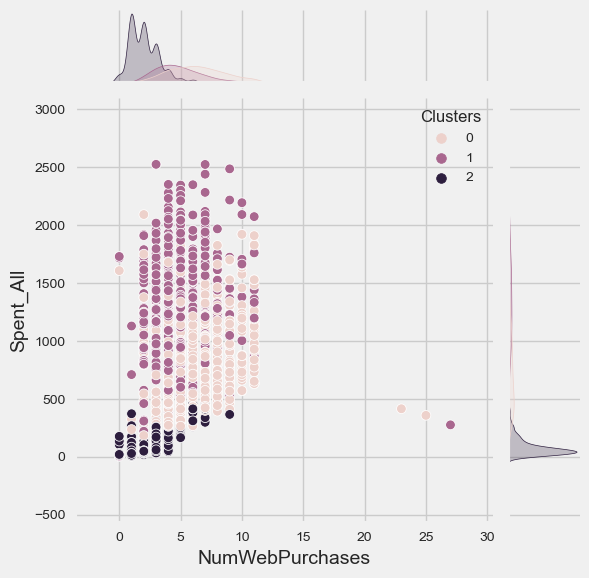

<Figure size 800x550 with 0 Axes>

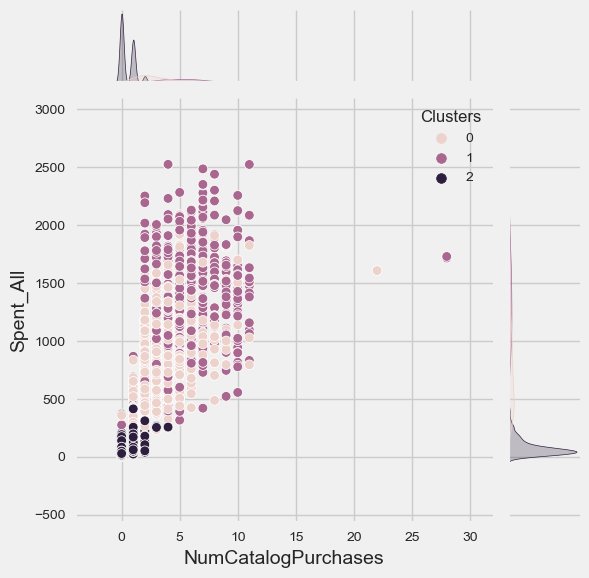

<Figure size 800x550 with 0 Axes>

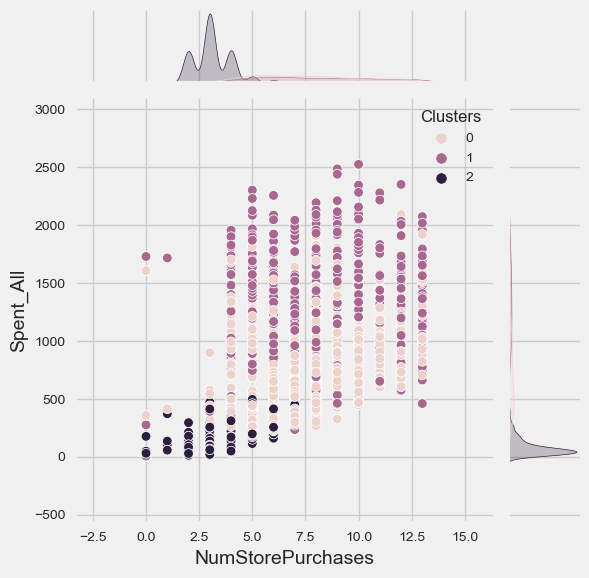

<Figure size 800x550 with 0 Axes>

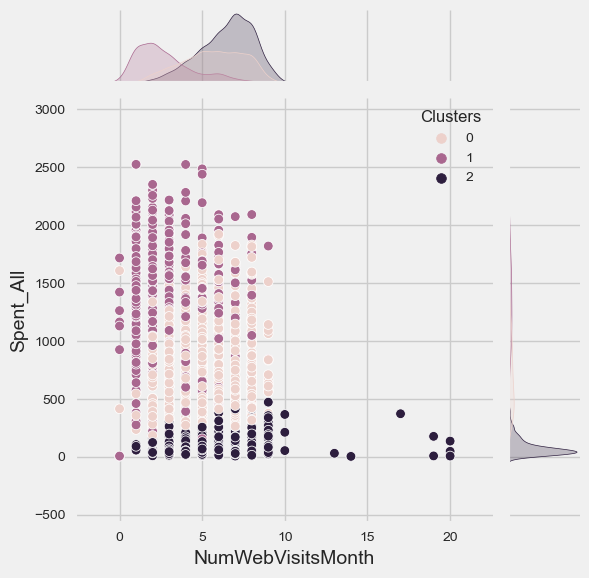

In [92]:
#for more details on the purchasing style 

for i in Places:
    plt.figure()
    sns.jointplot(x=data[i],y = data["Spent_All"],hue=data["Clusters"])
    plt.show()

plt.show()

<br>

### 할인 / 프로모션 민감도 

아래의 피벗 테이블을 통하여 다음과 같이 분석하였습니다.

* `Cluster 0 - Is_parent`:
    * 부모인 고객들이 프로모션 구매횟수인 `NumDealsPurchases`에서 평균적으로 약 1회 더 구매하는 것으로 나타났으며, 프로모션 수락 횟수인 `Total_Promos`는 거의 3배 가량 높습니다. 
    * 다만, 부모 여부에 관계없이 C1의 고객의 `PurDeal_PurAll_ratio`는 거의 비슷합니다.
    * C1이면서 부모일수록 프로모션에 민감함을 알 수 있습니다.
    
   
   
* `Cluster 1 - Is_parent`:
  
    * C0은 전반적으로 프로모션에 수락하는 횟수인 `Total_Promos`는 다른 클러스터 대비 높으나, 총 구매금액 대비 할인 구매금액 비율인 `PurDeal_PurAll_ratio`는 제일 낮습니다.
    * 이 경우 C0의 고객들은 일용품과 같은 상대적으로 저렴한 아이템의 프로모션들을 많이 활용하는 것을 예상할 수 있습니다. 아니면, 해당 마트의 프로모션이 대부분 일용품에만 국한되는지를 검토해볼 수 있다면 더욱 C0의 할인/프로모션 민감도를 해석하는 데에 도움이 될 것으로 판단됩니다.

    
* `Cluster 2 - Is_parent`:
    * C1에서의 결과와 비슷하지만, `PurDeal_PurAll_ratio`의 측면에서 보면 부모 여부에 따라 꽤 많은 차이가 납니다.
    * C2의 소득수준이 낮았던 것을 비추어 볼 때 충분히 납득할 수 있는 결과로 여겨집니다.
    * 다만, 할인받아 구매한 횟수 대비, 프로모션을 수락한 횟수는 상대적으로 굉장히 적게 나타납니다. 
    * 할인의 경로와 프로모션의 경로가 서로 다른지를 확인할 수 있다면 더욱 유의미한 분석을 할 수 있을 것으로 판단됩니다.

    
    
* ***인사이트***
    * 클러스터 간의 구매 경로 비중을 고려해 볼 때, 할인의 경로는 주로 매장이나 웹사이트, 프로모션의 경로는 카탈로그일 것으로 추정됩니다. 
    * 본 데이터만으로는 각 프로모션이 어떤 것인지도 확인할 수가 없어 많이 아쉽지만, 우선 프로모션이 있다는 점만 받아들이고 분석을 수행하였습니다.

In [93]:
Promos =['NumDealsPurchases', 'PurDeal_PurAll_ratio', 'Total_Promos'] 

pd.pivot_table(data = data, index = ['Clusters', 'Is_Parent'], values = Promos, margins=True)

NumDealsPurchases  PurDeal_PurAll_ratio  Total_Promos
Clusters Is_Parent                                                       
0        0                   2.875000              0.156683      0.125000
         1                   3.768875              0.176068      0.360555
1        0                   1.058480              0.054874      1.033138
         1                   1.340909              0.064240      1.204545
2        0                   1.405405              0.191283      0.135135
         1                   2.161036              0.260386      0.180180
All                          2.325350              0.180277      0.448712

연속형 변수인 `Spent_All`과 할인/프로모션 관련 변수들의 관계를 살펴 보았습니다.

기존 상관관계분석에서 해당 변수들끼리의 상관관계가 다소 있는 것으로 확인된 만큼, 클러스터 간의 차이를 보여주는 모습입니다.

예를 들어 C1의 경우 할인 구매 횟수는 적지만 총 구매금액은 높으며, 프로모션의 수락도 다른 클러스터에 비해 활발한 모습을 나타내고 있습니다.

<Figure size 800x550 with 0 Axes>

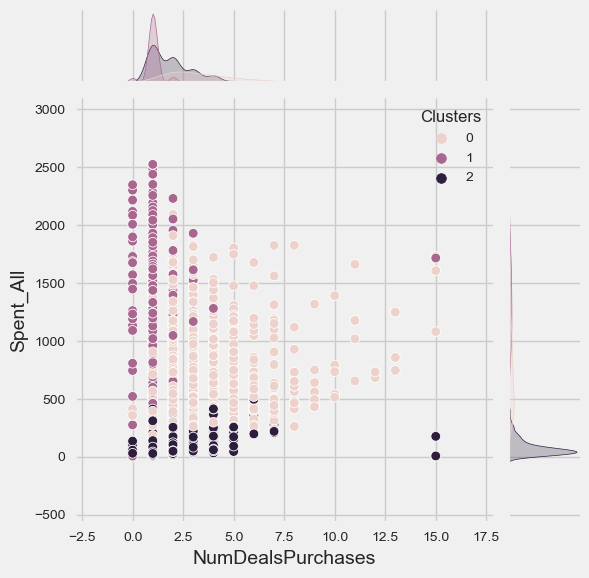

<Figure size 800x550 with 0 Axes>

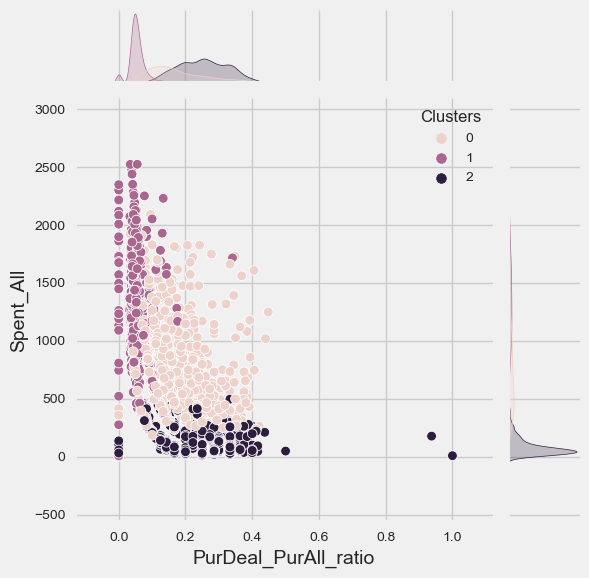

<Figure size 800x550 with 0 Axes>

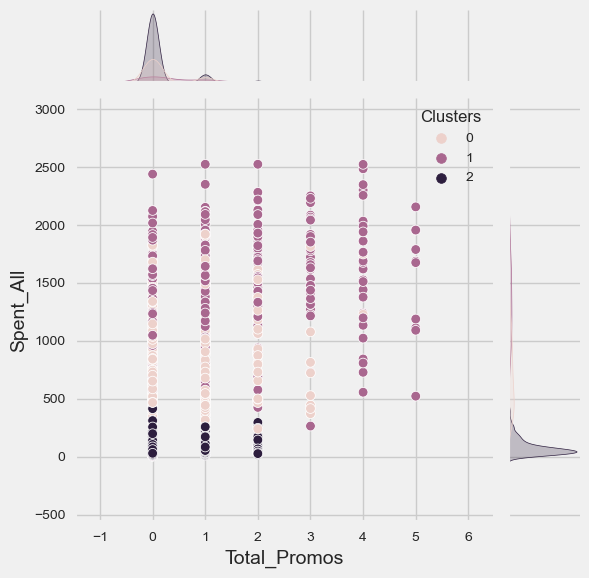

In [94]:
# for more details on the promotion sensitivity

for i in Promos:
    plt.figure()
    sns.jointplot(x=data[i],y = data["Spent_All"],hue=data["Clusters"], kind='scatter')
    plt.show()

plt.show()

<br>

아래는 각 클러스터별 프로모션 수락 횟수를 나타낸 것입니다.

C1의 경우는 아예 수락하지 않는 경우도 있지만 3~5회 수락하는 경우도 있는 것으로 나타났습니다.

그러나 C2의 경우는 대부분이 단 한번도 프로모션을 수락하지 않는 것으로 나타납니다.

데이터의 설명이 부족하여 어떤 프로모션들이 있었는지는 알 수 없지만 C0과 C1에 대비해서 C2의 고객들은 프로모션 대상 제품에 관심/관련이 없거나, 프로모션 자체에 대해 여력이 없는 고객들이 대부분이라고 추정할 수 있습니다.

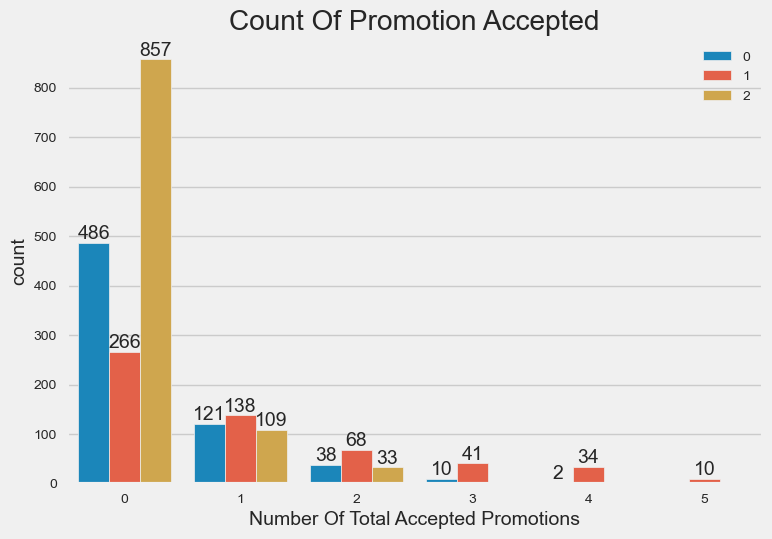

In [95]:
#Plotting count of total campaign accepted.

plt.figure()
ax = sns.countplot(x = data["Total_Promos"], hue = data["Clusters"])
ax.set_title("Count Of Promotion Accepted")
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[2])
ax.set_xlabel("Number Of Total Accepted Promotions")
plt.legend(loc = 'upper right')
plt.show()

<br>

아래는 각 클러스터별 할인구매 횟수를 나타냅니다.

C0의 경우가 가장 다양하게 할인구매를 이용하였고, C1의 경우는 다른 클러스터 대비 할인구매를 많이 이용하지 않았던 것으로 나타났습니다.

이를 통해 프로모션 대상 제품과 할인 대상 제품이 성격이 다를수도 있음을 추정할 수 있습니다.

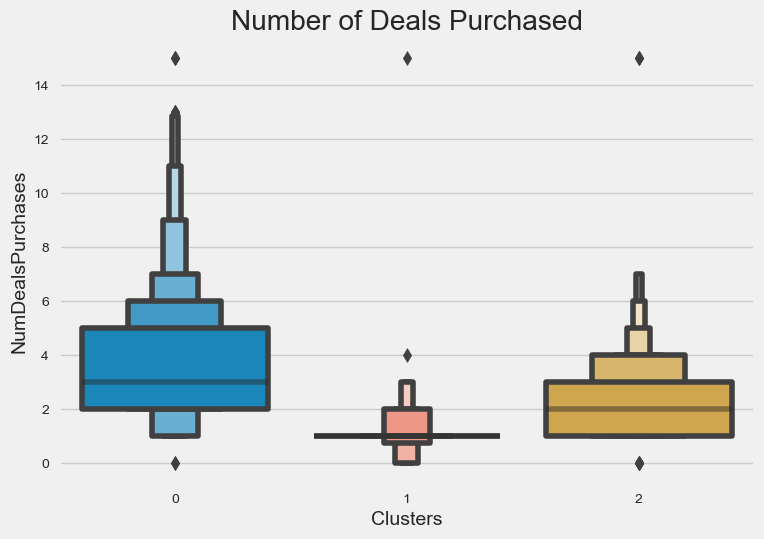

In [96]:
#Plotting the number of deals purchased

plt.figure()
ax = sns.boxenplot(y=data["NumDealsPurchases"],x=data["Clusters"])
ax.set_title("Number of Deals Purchased")
plt.show()

***[목차로 이동](#contents)***

<br><br>

<a id = "7-3"></a>

## 7-3. 클러스터별 개인정보

클러스터별 개인정보 분석에는 다음의 변수를 사용하였습니다.

* `Income`, `Education`, `Cus_for`, `Age`, `Is_Parent`, `Kidhome`,`Teenhome`, `Children`, `Family_Size` 

<br>

구매행동 분석과 마찬가지로 `Is_Parent`변수와 결합하여 분석하였습니다.

In [97]:
Personal = ["Income", "Education", "Cus_for", "Age", "Kidhome","Teenhome", "Children", "Family_Size" ]

pd.pivot_table(data = data, index = ['Clusters', 'Is_Parent'], values = Personal, margins=True)

Age  Children     Cus_for  Education  Family_Size  \
Clusters Is_Parent                                                            
0        0          64.625000  0.000000  563.750000   0.875000     1.625000   
         1          56.372881  1.234206  406.400616   1.000000     2.922958   
1        0          52.857700  0.000000  347.653021   1.000000     1.596491   
         1          49.159091  1.000000  306.795455   1.000000     2.590909   
2        0          48.864865  0.000000  364.567568   0.855856     1.621622   
         1          48.933559  1.409910  317.828829   0.958333     3.058559   
All                 52.082693  0.947582  353.731586   0.975599     2.593312   

                          Income   Kidhome  Teenhome  
Clusters Is_Parent                                    
0        0          34179.125000  0.000000  0.000000  
         1          59697.798921  0.231125  1.003082  
1        0          74669.732943  0.000000  0.000000  
         1          75713.750000  0.363636  0.636364  
2        0          24988.126126  0.000000  0.000000  
         1          35299.034347  0.914414  0.495495  
All                 51863.310890  0.441934  0.505648

<br>

주요 변수들을 클러스터별로 살펴보면 아래와 같습니다. 위의 피벗테이블과 함께 해석해보면,

* `부모인 경우`: 같은 부모인 경우이더라도 클러스터에 따라 다른 정보를 갖고 있습니다.
    * `Age`: C0의 나이가 많은 편이고 나머지 클러스터는 큰 차이가 없습니다.
    * `Children`: C1의 부모들은 평균 1명의 자녀를, C1, C2는 각각 평균 1.2, 1.4명의 자녀를 갖고 있습니다.
    * `Cus_for` : C0의 부모들의 회원가입 기간이 564일로 제일 깁니다.
    * `Education`: C0, C1의 부모들은 모두 고등교육까지 마쳤으나 C2의 부모들은 일부가 기본교육까지만 마쳤습니다.
    * `Family_Size`: C2의 가족규모가 3.1명으로 가장 많으며, C0의 가족규모도 2.9명입니다.
    * `Income`: C1의 평균소득이 76228로 가장 높으며 C2의 평균소득 35269 대비 2배 가까이 차이가 납니다. C0의 평균소득은 59767입니다.
    * `Kidhome` & `Teenhome`: C0, C1에는 10대 자녀의 비중이 더 높으나, C2에는 Kids의 비중이 더 높게 나타납니다.
    
    
* `부모가 아닌 경우`: 
    * `Age`: C0의 평균나이가 64세로 가장 많으며 그 다음으로 C1, C2순입니다.
    * `Cus_for`: 부모인 경우와 마찬가지로 C0의 고객들이 고객체류기간이 제일 길고, 더욱이 압도적으로 차이가 납니다.
    * `Education`: C0, C2의 경우는 일부가 기본교육까지만 마쳤습니다.
    * `Family_Size`: 부모가 아닌 경우에는 각 클러스터별로 큰 차이가 없습니다.
    * `Income`: 마찬가지로 C1의 평균소득이 74669로 가장 높고, C2가 가장 낮습니다.
    
    
* ***인사이트***
    * C1 그룹은 고객 체류 기간은 짧지만, 소득이 높은 고객들입니다.
    * C0 그룹은 고객 체류 기간도 길고, 중간정도의 소득을 유지하고 있으며 10대 자녀들이 많으므로 생필품 및 식료품의 소비가 많을 것으로 보입니다.
    * C0 그룹에서 부모여부에 따라 고객 체류 기간의 차이가 큰 점을 감안해야 할 것으로 보입니다.
    * C2 그룹은 상대적으로 젊고, 10대 이전의 자녀들이 많다는 점을 알 수 있습니다.
    * 이러한 세부 타겟팅을 통해 더욱 고객에 적합한 마케팅 및 제품 홍보 전략을 세울 수 있을 것으로 판단됩니다.

<br>

클러스터별 부모 여부를 살펴보면,

* C0: 거의 모든(98.8%) 고객이 부모에 해당합니다.

* C1: 부모인 고객이 7.2%에 해당합니다. 

* C2: 대부분의(88.8%) 고객이 부모에 해당합니다.

In [98]:
# only 7% of people in cluster 0 is parents.

data['Is_Parent'].groupby(data['Clusters']).mean()

Clusters
0    0.987823
1    0.078995
2    0.888889
Name: Is_Parent, dtype: float64

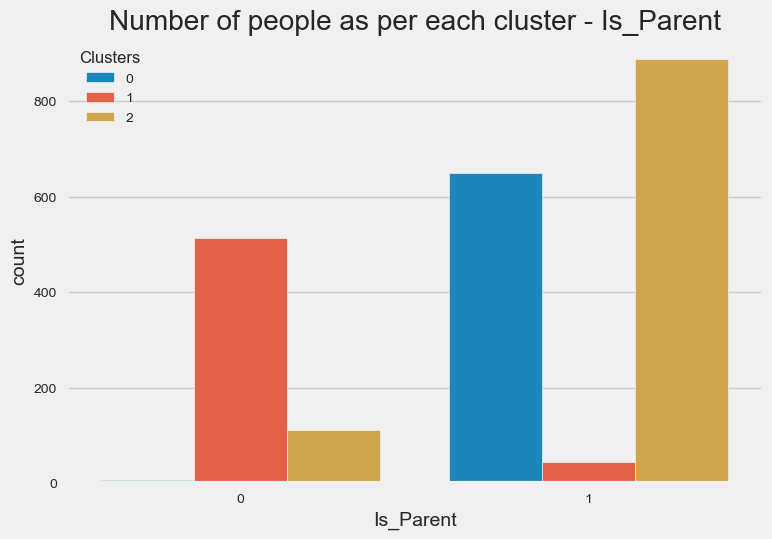

In [99]:
sns.countplot(data = data, x = 'Is_Parent', hue = 'Clusters')
plt.title('Number of people as per each cluster - Is_Parent')
plt.show()

<br>

연속형 변수인 `Spent_All`을 개인정보 변수들과 비교해 보았습니다.

상관관계분석에서 `Income`변수는 `Spent_All`과 상관관계가 높았지만, `Cus_for`, `Age`와 같은 변수는 상관관계가 그리 크지 않음이 그대로 반영되었음을 볼 수 있습니다. 

<Figure size 800x550 with 0 Axes>

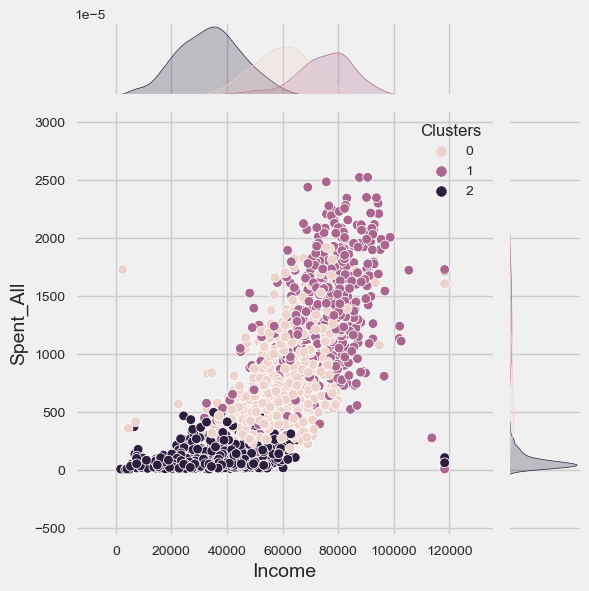

<Figure size 800x550 with 0 Axes>

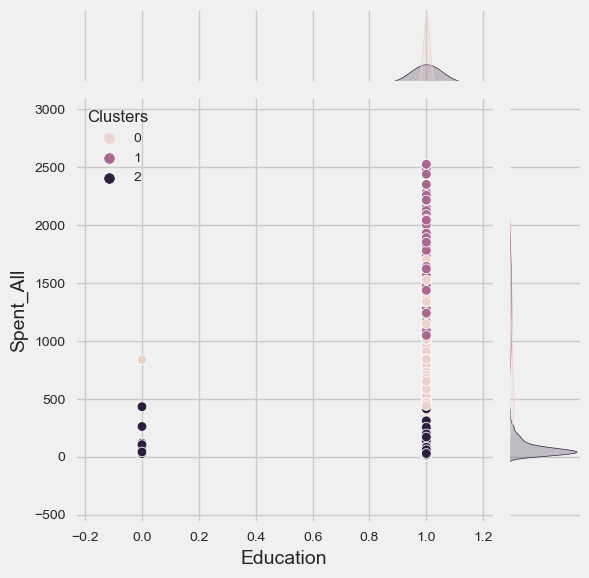

<Figure size 800x550 with 0 Axes>

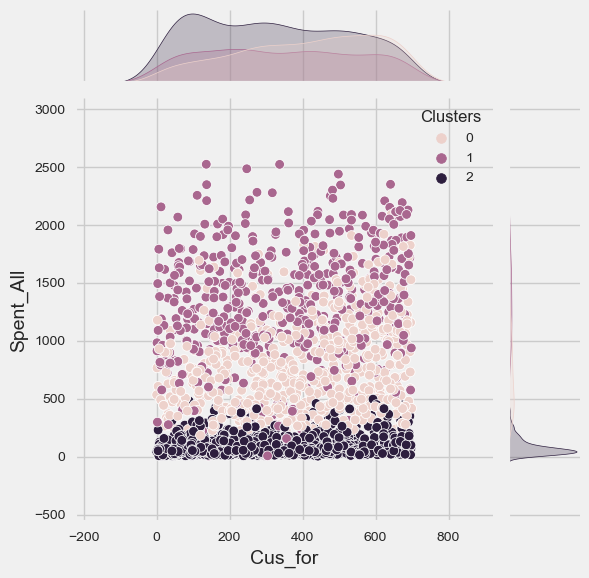

<Figure size 800x550 with 0 Axes>

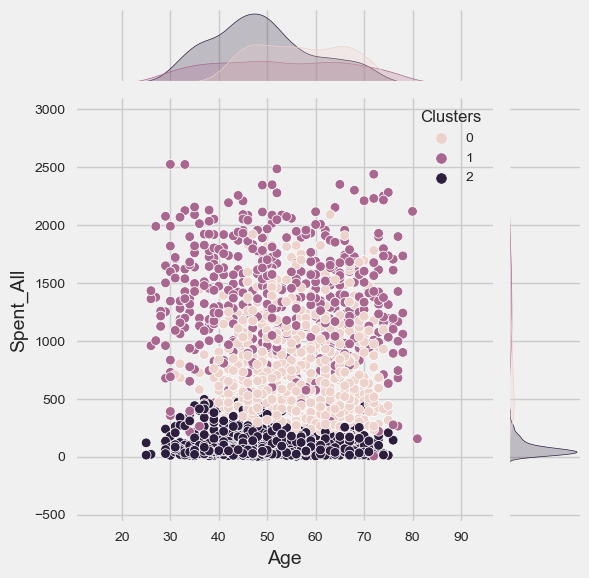

<Figure size 800x550 with 0 Axes>

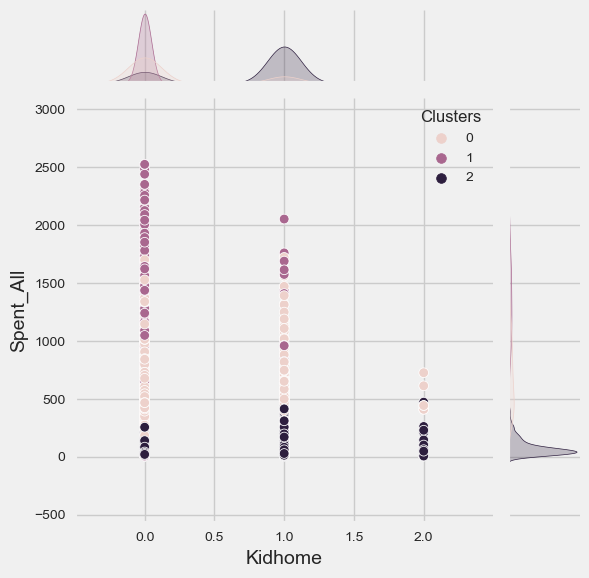

<Figure size 800x550 with 0 Axes>

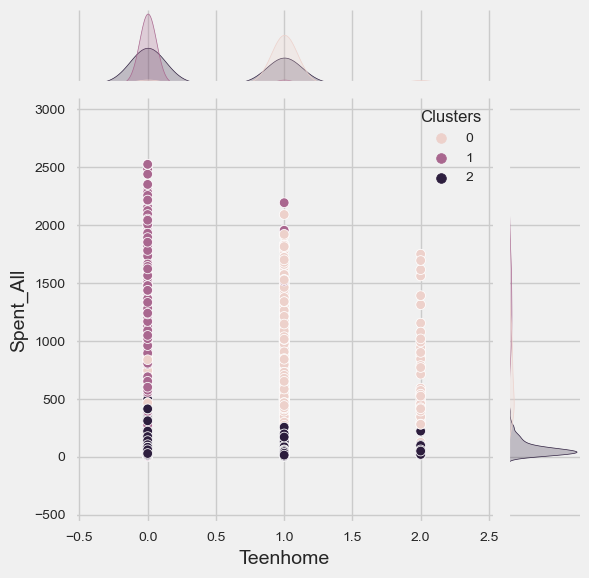

<Figure size 800x550 with 0 Axes>

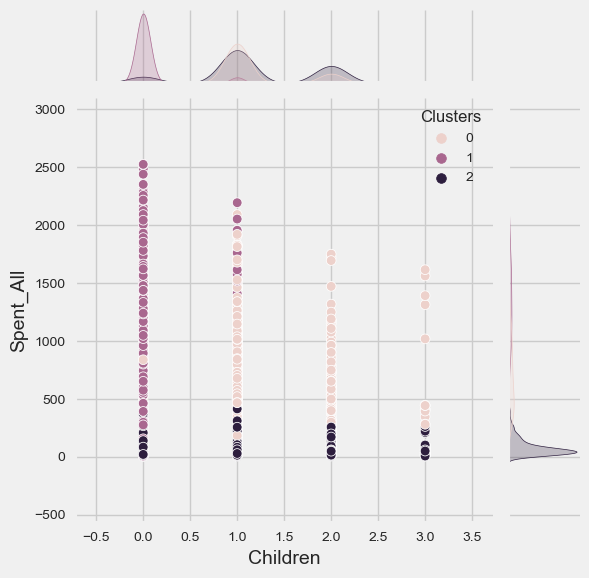

<Figure size 800x550 with 0 Axes>

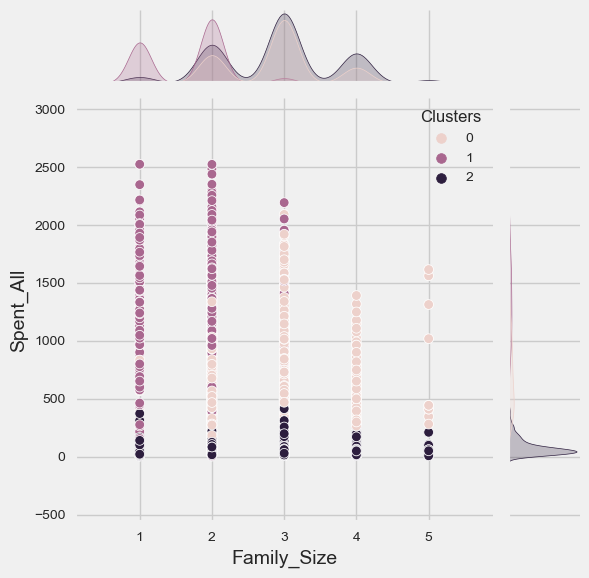

In [100]:
for i in Personal:
    plt.figure()
    sns.jointplot(x=data[i], y=data["Spent_All"], hue =data["Clusters"])
    plt.show()


<br><br>

<a id = "7-4"></a>

## 클러스터별 고객 프로파일링 및 마케팅 제안


* **Cluster 0:**
    * `Income` : 중간정도의 소득을 유지하는 구간이나, 부모의 경우에 소득이 평균 약 1.7배 더 높습니다.
    * `Age`: 평균연령이 약 60대입니다. 은퇴를 앞둔 시니어 레벨이 많을 것으로 추정됩니다.
    * `Is_Parent`: 거의 전부인 98%가 부모입니다. 
    * `Education`: 거의 모든 사람이 고등교육(대학 이상)까지 마쳤습니다.
    * `Family_Size`: 평균 가족 수는 2.9명이며, 그들 자녀의 대부분이 10대입니다.
    * `Purchasing Style`: 주로 매장과 웹에서 구매하며, 최근 웹사이트 방문횟수가 타 클러스터 대비 높습니다. 부모의 경우에는 카탈로그 구매 횟수가 높습니다.
    * `Promotion`: 프로모션 수행 시 수락할 가능성이 낮습니다.
    * `Discount` : 전체 구매 횟수에서 할인 구매횟수의 비율이 높은 편이며, 특히 부모일수록 더 할인에 민감하게 반응합니다.
    
    
* **Cluster 1:**
    * `Income` : 가장 **높은 소득** 구간을 가집니다. 부모여부에 따른 소득차이는 거의 없습니다.
    * `Age`: 평균연령이 **약 50세 전후**이며, 소득이 높은 것으로 보아 **전문직과 같이 고소득의 커리어**를 가진 사람들이 많을 것으로 추정됩니다.
    * `Is_Parent`: 이 클러스터의 93%는 **부모가 아닙니다.**
    * `Education`: 모든 사람이 **고등교육(대학 이상)**까지 마쳤습니다.
    * `Family_Size` : 가족 규모는 다른 클러스터 대비 제일 작습니다.
    * `Purchasing Style`: 주로 **매장**에 직접 방문하지만, 타 클러스터 대비 상대적으로 **카탈로그** 구매 횟수가 굉장히 높습니다. 웹사이트 구매가 이루어지는 편이나, 방문횟수는 적습니다.
    * `Promotion`: 프로모션 수행 시 수락할 가능성이 높습니다. 
    * `Discount`: 전체 구매 횟수에서 할인 구매횟수의 비율이 크지 않습니다.
    
   
* **Cluster 2:**
    * `Income` : 가장 낮은 소득의 구간이나, 부모의 경우에 소득이 평균 약 1.4배 더 높습니다.
    * `Age`: 평균연령이 약 48세로 상대적으로 가장 젊은 구간입니다.
    * `Is_Parent`: 88%가 부모입니다. 
    * `Education`: 교육수준은 상대적으로 낮은 편입니다.
    * `Family_Size` : 평균 가족 수는 3명이 약간 넘으며, 그들 자녀의 대부분은 10대 이하입니다.
    * `Purchasing Style`: 주로 매장에서 구매합니다. 특이사항은, 최근 웹방문은 높으나 웹구매횟수는 적습니다.
    * `Promotion`: 프로모션 수행 시 수락할 가능성이 제일 낮습니다.
    * `Discount`: 전체 구매횟수에서 할인 구매횟수의 비율이 가장 높습니다.특히 부모일수록 더 할인에 민감하게 반응합니다.

<br><br>
    
* **타겟 마케팅 제안**
    * 프로모션: C0고객의 프로모션 수락 가능성이 높으므로, 이들의 주 구매경로인 매장과 카탈로그를 통해 프로모션을 수행하는 것이 마케팅 효율을 높일 수 있습니다.
    * 할인: 기본적으로 클러스터들의 주 구매경로는 매장입니다. 추가적인 할인정책은 제품 카테고리에 따라 다를수 있습니다만, C1과 C2의 주 유입경로인 웹사이트 내의 할인정책이 효율이 높을 것으로 보입니다. C1의 고객은 이미 웹사이트 구매 및 방문이 높은 편이며, C2는 웹사이트의 방문은 많지만 구매 횟수는 많지 않습니다. 따라서 이들 두 클러스터의 주 구매 상품 카테고리를 확인한 뒤 할인정책을 웹사이트 내에서 수행하면 유입과 전환에서 전부 긍정적인 결과가 있을 것으로 판단됩니다.


<br>

<a id = "8"></a>

# 결론 및 한계점

* **`Is_Parent`, `Income` 변수는 각 클러스터의 프로파일링에 굉장히 중요한 변수였습니다.**

* **`Promotion`과 `할인`은 별개의 것으로 추정됩니다. 이를테면, C1에서 고객들은 프로모션을 수락하는 횟수인 `Total_Promos`는 높지만 총 구매 수 중 할인 구매횟수 비율인 `PurDeal_PurAll_ratio` 은 굉장히 낮습니다.**


* **프로젝트의 한계점:**
    * 데이터의 출처가 불분명하여, 해당 회사/지역 등의 특성을 유추하여 분석에 반영할 수 있는 여지가 부족했습니다.
    * 6회에 걸친 프로모션이 정확히 어떤 프로모션인지 데이터만 갖고는 확인할 수 없었습니다.
    * 프로모션의 수락 횟수, 또는 할인구매횟수가 많고 적음도 중요하지만, 해당 프로모션 및 할인과 관련한 ***구매 금액***이 오히려 고객의 민감도를 정확히 해석하는 데 중요한 역할을 할 것으로 생각됩니다. 만약 프로모션 구매 금액과 할인구매 금액에 대한 변수가 있다면 굉장히 유용했을 것 같습니다.
    * 본 프로젝트는 개인정보 및 구매행동(구매 장소 및 프로모션 민감도)을 위주로 수행하였고, 육류구매금액 등 구매제품 범주를 활용한 분석은 해석의 복잡성을 고려하여 생략하였습니다. 
    * 모든 변수에서 추출한 주성분들을 이용하여 차원을 축소했기 때문에 어떤 특정 변수가 고객 클러스터링에 영향을 미치는지는 사후적인 해석으로만 가능했습니다. 
    * 웹의 경우, 유입 경로 또는 구매 시간 등의 데이터가 있다면 더욱 타겟 마케팅에 유의미한 제안이 도출될 것으로 판단됩니다.
    

<br><br>

시간내어 읽어주셔서 감사합니다.  끝.